In [1]:
import numpy as np
import random as rd
import matplotlib.pyplot as plt
import newick
from copy import deepcopy
from io import StringIO
from itertools import repeat
import math
import itertools
from collections import Counter
import pandas as pd
from itertools import combinations
from itertools import chain

In [2]:
def generate_newick_tree(name, depth, max_children=3):
    if depth == 0:
        return f'{name}:{rd.randint(1,5):.2f}'
    else:
        num_children = rd.randint(1, max_children)
        child_trees = []
        for i in range(num_children):
            child_name = f'{name}{chr(97 + i)}'
            child_trees.append(generate_newick_tree(child_name, depth - 1, max_children))
        return f'({",".join(child_trees)}):{rd.randint(1,5):.2f}'


In [3]:

#a hosszak szétválasztása egy mátrixra
def nested_list_to_paths(lst, path=[]):
    if isinstance(lst, list):
        if len(lst) == 1:
            return nested_list_to_paths(lst[0], path)
        else:
            result = []
            for i in range(1, len(lst)):
                result.extend(nested_list_to_paths(lst[i], path + [lst[0]]))
            return result
    else:
        return [path + [lst]]
    
    
## ez megoldás fv, általánosítva

def get_the_lengths(depth, matrix):
    ## első rész:
    ## a korábban meghatározott mátrixból kiszedi azokat a hosszakat, amelyek szükségesek
    uthosszak=[ [0] for i in range(pow(2, depth))]
    for k in range(2,depth):
        for i in range(pow(2, depth)):
            n=depth-k
            if i%pow(2,n) == 0 and (i//pow(2,n))%2 == 1:
                uthosszak[i]=(matrix[i][k::])
    for i in range(pow(2, depth)):
        if i==0:
            uthosszak[i]=(matrix[0])
        if i%2 == 1:
            uthosszak[i]=([matrix[i][depth]])
        if i == (pow(2,depth))/2:
            uthosszak[i]=(matrix[i][1::])
    final=[ [0] for i in range(len(uthosszak))]
    ## második rész:
    ## a hosszakat összeadja,a kimenet tartalmazza az infót, hogy milyen hosszú az ág és milyen pontoknál ágazódik el ténylegesen
    for i in range(len(uthosszak)):
        final[i]=[ [0] for i in range(len(uthosszak[i]))]
        n=0
        for j in range(len(uthosszak[i])):
            n=n+uthosszak[i][j]
            final[i][j]=n
    return uthosszak, final

In [5]:
def print_lengths(node):
    lengths=[node.length]
    for descendant in node.descendants:
        lengths.append(print_lengths(descendant))
    return(lengths)

In [6]:
##Ebben a részben foglalkozok már sejtekkel
#jó kód, nem piszkálni

#ezeket választjuk ki osztódásra: bemenetek: l-kezdeti list, k-hányat választunk ki
def choose_from_population(l, k):
    chosen_samples=rd.sample(range(len(l)),k)
    return chosen_samples

#osztódás
def duplication(culture, for_duplication):
    after_duplication=[]
#itt range(N) volt eddig
    for i in range(len(culture)):
        if i in for_duplication:
            after_duplication.append(deepcopy(culture[i]))
            after_duplication.append(deepcopy(culture[i]))
        else:
            after_duplication.append(deepcopy(culture[i]))
    return after_duplication

# mutációk gyűjtése
def getting_mutations(duplicated_list, m):
    r=0.365 #ez a mutációs ráta osztódásonként
    mutates = deepcopy(duplicated_list)
    for i in range(len(mutates)):
        c = rd.uniform(0,1)
        #print(c)
        if c <= r:
            mutates[i].append(m)
            m = m+1
    return (mutates, m)

#sejtek elpusztítása
def kill(duplicated_list,for_death):
    result2=[]
    for i in range(len(duplicated_list)):
        if i not in for_death:    
            result2.append(duplicated_list[i])
    return result2


#egybegyúrva a két fv. Ez csak azokban csinál mutációt, ami osztódik
def duplication_and_mutation(culture, for_duplication, m):
    after_duplication=[]
    r=0.365
#itt range(N) volt eddig
    for i in range(len(culture)):
        mutates=[]
        if i in for_duplication:
            mutates.append(deepcopy(culture[i]))
            mutates.append(deepcopy(culture[i]))  
            for j in range(2):
                c = rd.uniform(0,1)
                #print(c)
                if c <= r:
                    mutates[j].append(m)   
                    after_duplication.append(deepcopy(mutates[j]))
                    m = m+1
                else:
                    after_duplication.append(deepcopy(mutates[j]))    
        else:
            after_duplication.append(deepcopy(culture[i]))
    return after_duplication,m

#potenciális rügyek képzése: véget ér a Moran-folyamat, marad N sejt.
#Ebből kiveszi a szélsőt, majd pótolja a megmaradt sejtekből úgy, hogy az osztódáskor mutáció is felléphet.
def creating_buds(after_moran, n):
    leolt = kill(after_moran, [n]) #ha az első sejtet akarom elpusztítani, akkor [0]-át kell beírni, ha az utolsó, a kettőződés miatt 5 sejtnél [5]-öt
    bud = after_moran[n] #ide ugyanazt a számot beírni, mint egy sorral feljebb.
    return (leolt, bud)

def creating_buds_random(after_moran, n):
    a = rd.randint(1,n)
    leolt = kill(after_moran, [a]) #ha az első sejtet akarom elpusztítani, akkor [0]-át kell beírni, ha az utolsó, a kettőződés miatt 5 sejtnél [5]-öt
    bud = after_moran[a] #ide ugyanazt a számot beírni, mint egy sorral feljebb.
    return (leolt, bud)
#2024.03.08. Véletlenszeren legyen eldöntve, hogy az első vagy az utolsót vesszük ki. --> nem mutat változást :/
#def creating_buds(after_moran):
#    i = rd.uniform(0,1)
#    if i < 0.5:
#        leolt = kill(after_moran, [7]) #ha az első sejtet akarom elpusztítani, akkor [0]-át kell beírni, ha az utolsó, a kettőződés miatt 5 sejtnél [5]-öt
#        bud = after_moran[7] #ide ugyanazt a számot beírni, mint egy sorral feljebb.
#    else:
#        leolt = kill(after_moran, [0])
#        bud = after_moran[0]
#    return (leolt, bud)




##
#az elágazott rügyek csak 1-1 sejjtel rendelkeznek. Ezeket fel kell sokszorozni N-ig
#ötlet: csinálja azt, hogy mindig duplázódik, majd utolsó osztódásnál csak a maradék osztódik

#ehhez kell N-nek a N=2^n+k alakú felbontása
def decider(n):
    k=0
    while 2**(k+1)<=n:
        k += 1
    r=n-pow(2,k)
    return k,r

#ez pedig az osztódás rész
def propagation(n,single_cell, starter_mutation): #1 bemenet: 1 sejt a mutációkkal.
    bemenet=deepcopy(single_cell)
    mutate_m=starter_mutation
    for i in range(decider(n)[0]):
        #print('Culture:', bemenet)
        #print(bemenet)
        valasztott=choose_from_population(bemenet,len(bemenet))
        #print(valasztott)
        kettozott_es_mutalt, mutate_m=duplication_and_mutation(bemenet,valasztott, mutate_m)
        #print(kettozott_es_mutalt)
        #mutalt=getting_mutations(kettozott,last_mutation)
        #print(mutalt)
        #last_mutation=mutalt[1]
        bemenet=deepcopy(kettozott_es_mutalt)
        #print('Culture:', bemenet)
    valasztott=choose_from_population(bemenet,decider(n)[1])
    #print(valasztott)
    kettozott_es_mutalt, mutate_m=duplication_and_mutation(bemenet, valasztott, mutate_m)
    #print(kettozott_es_mutalt)
    #mutalt=getting_mutations(kettozott,last_mutation)
    #print(mutalt)
    bemenet=deepcopy(kettozott_es_mutalt)
    #print(bemenet)
    last_mutation=mutate_m
    
    return(bemenet, last_mutation)

In [7]:
#probléma a véglegessel: amikor átadja az utódokat, akkor nincs külső [] lista jel
def simulate(to, n, starter_culture, starter_mutation): 
                                #bemenete: to->lista, ami tartalmazza, hogy meddig megy és hol égazik
                                #starter_culture->lista, ami tartalmazza a mutációkat
                                #starter_mutation->kezdeti mutációs szám
    
    mutate_m = starter_mutation
    culture = deepcopy(starter_culture)
    branching_buds = []
    #print('Kezdeti populáció:', culture)
    #lim=int(to[-1]) #to utolsó eleme tartalmazza, hogy meddig menjen --> korábban
    lim = to
    if len(culture) == 1:
        culture, mutate_m=propagation(n,culture,mutate_m)
    for i in range(lim):
        #print(i)
        #print('\n','Populáció a(z)', i+1,'. lépés kezdetén', culture)
        k = 1
        choices = choose_from_population(culture,k)
        #print('Sorszám osztódásra:',choices)
        duplicated_and_mutated, mutate_m = duplication_and_mutation(culture, choices, mutate_m)
        #print('Megkettőződtek és mutáltak',duplicated_and_mutated)
        after_creating_buds = deepcopy(creating_buds_random(duplicated_and_mutated, n)[0])
        #print('Rügyképzés után:',after_creating_buds)  
        if i == lim - 1:
            #branching_buds.append([deepcopy(creating_buds(duplicated_and_mutated)[1])])
            branching_buds=[deepcopy(creating_buds_random(duplicated_and_mutated, n)[1])]
        culture=deepcopy(after_creating_buds)
    #print('Kimeneti populáció', culture)
    #print('Rügy:', branching_buds)
    next_mutation=mutate_m
    return culture, branching_buds,next_mutation

In [8]:
##DFS átírása, ez már működik!!!
def DFS(node, brain_list):
    lengths = []
    print('Ezen a node-on vagyunk:', node.name)
    a = node.length
    children = node.descendants[::-1]
    print('Ennyi gyereke van:', len(children))
    if len(children) == 2:
        brain_list.append('Sajt')
    print(brain_list)
    lengths.append(a)
    for descendants in node.descendants[::-1]:
        if descendants.name != None:
            if len(brain_list) != 0:
                brain_list.pop() 
        kisebb_fa=DFS(descendants, brain_list)
        lengths.append(kisebb_fa)
    #print(szamok)

    return (lengths)

## A következő implementálnivaló az az, hogy megy a simulate, annak az eredményeit lmenti egy listában sorozatban. A levelekig átveszi azt az elemet, ami továbbmegy, tehát mindig az előzőt, illetve az utolsó mutációt. 


## Valamint beleírja egy másik listába azokat, ahol 2 gyerek van. És amikor levélhez érünk, akkor ennek veszi majd ki az utolsó elemét, illetve az előző lista utolsó elemének mutációs számát. Ha ez megtörténik, kitölrni az utolsó elemet.

## valamint legyen egy plusz lista, ami az egészet megtartja.

In [9]:
##a működőbe beletenni a resultot:

#2023.12.10 Ebben a formában csak az ágvégi eredményeket adja vissza. Ha minden kell (next_mut, branching_buds), akkor az end_of_branch.append(res)  !

#def DFS(node, n, last_node_name,  brain_list, starter_list=[starter_culture, starter_mutation], results):
def DFS(node, n, last_node_name, last_node_children_number,  brain_list, starter_list, results, end_of_branch):
    lengths = []
    last_node_name.append(node.name)
    a = node.length
    children = node.descendants[::-1]
    last_node_children_number.append(len(children))
    #print('\n')
    #print('Az előző node neve:',last_node_name[-2])
    #print('Előző node gyerekek száma:', last_node_children_number[-2])
    #print('\n')
    #print('Ezen a node-on vagyunk:', node.name)
    #print('Node hossza:', node.length)
    #print('Ennyi gyereke van:', len(children))
    #print('\n')
    if len(children) == 2 and last_node_children_number[-2] == 2:
        res = simulate(int(a), n , starter_list[1], starter_list[2])
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        brain_list.append(res[0])

    elif len(children) == 2 and last_node_children_number[-2] == 1:
        res = simulate(int(a), n , starter_list[0], starter_list[2])
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        brain_list.append(res[0])

    elif len(children) == 1 and last_node_children_number[-2] == 2:
        res = simulate(int(a), n , starter_list[1], starter_list[2])
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]

    elif len(children) == 1 and last_node_children_number[-2] == 1:
        res = simulate(int(a), n , starter_list[0], starter_list[2])
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]

    elif len(children) == 2 and last_node_children_number[-2] == 0:
        res = simulate(int(a), n , brain_list[-1], starter_list[2])
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        if len(brain_list) != 0:
            brain_list.pop() 
        brain_list.append(res[0])


    elif len(children) == 1 and last_node_children_number[-2] == 0: 
        res = simulate(int(a), n , brain_list[-1], starter_list[2])
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        if len(brain_list) != 0:
            brain_list.pop() 
    
    elif len(children) == 0 and last_node_children_number[-2] == 0:
        res = simulate(int(a), n , brain_list[-1], starter_list[2])
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        end_of_branch.append(res[0])
        if len(brain_list) != 0:
            brain_list.pop() 
    
    elif len(children) == 0 and last_node_children_number[-2] == 1:
        res = simulate(int(a), n , starter_list[0], starter_list[2])
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        end_of_branch.append(res[0])
    
    elif len(children) == 0 and last_node_children_number[-2] == 2: 
        res = simulate(int(a), n , starter_list[1], starter_list[2])
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        end_of_branch.append(res[0])
    
    #print(brain_list)
    lengths.append(a)
    for descendants in node.descendants[::-1]:

        #if descendants.name != None:
        #    if len(brain_list) != 0:
        #        brain_list.pop() 
        kisebb_fa=DFS(descendants, n, last_node_name, last_node_children_number, brain_list, starter_list, results, end_of_branch)
        #lengths.append(kisebb_fa)

    return end_of_branch

In [10]:
#newick_tree=generate_newick_tree('a',2,2)
#newick_tree='''((((aaaa:35):41,aaaba:41):47,aabaa:40):83,abaaa:72):115'''
#a Poplar fa: ''' ((aaaaaa:5,((((aabaaa:29):31,aabaab:41):44,aababa:70):72,aabbaa:80):113):14,((((abaaaa:35):41,abaaba:41):47,ababaa:40):83,abbaaa:72):115):13 '''

#2023.12.10. Fa átértelmezése:
#''' ((aaaaaa:6,((((aabaaa:29):13,aabaab:41):28,aababa:70):41,aabbaa:80):217):12,((((abaaaa:35):6,abaaba:41):36,ababaa:40):32,abbaaa:72):215):12 '''

#2023.12.19. update:
#''' ((Törzs:1,((((13.1:29):13,13.2:41):28,13.3:70):41,13.5:80):89):1,((((14.2:35):6,14.3:41):36,14.4:40):32,14.5:72):103)'''

newick_tree=''' ((Törzs:28,((((13.1:29):13,13.2:41):28,13.3:70):41,13.5:80):60):1,((((14.2:35):6,14.3:41):36,14.4:40):32,14.5:72):150):1'''


#print(newick_tree)
rd.seed()
sim=DFS(newick.loads(newick_tree)[0], 7, [None], [1], [], [[[],[],[],[],[],[],[]],[], 1], [], [])

In [11]:
print(sim)

[[[1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 183], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 178, 186], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 178, 187], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 178], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 173], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 166, 169, 175, 176]], [[1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 228, 235], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 228, 235, 243], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 228, 235], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 222, 236, 244], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 222, 236], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 230]], [[1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 246, 260, 

In [12]:
tree_14_res = sim[0:4]
tree_13_res = sim[4:8]
print(tree_13_res)
print(tree_14_res)

[[[343, 365, 368, 391, 395, 400, 412, 434, 456], [343, 365, 368, 391, 395, 400, 412, 434, 451, 457], [343, 365, 368, 391, 395, 400, 412, 434, 451, 457], [343, 365, 368, 391, 395, 400, 412, 434, 451, 458], [343, 365, 368, 392, 397, 417, 420, 424, 440, 447], [343, 365, 368, 392, 397, 417, 420, 424, 440, 447, 454], [343, 365, 368, 392, 397, 417, 420, 424, 440, 447, 454]], [[343, 365, 368, 467, 468, 483, 485, 496, 526, 529, 533, 534, 538, 548, 553], [343, 365, 368, 467, 468, 483, 485, 496, 526, 529, 533, 534, 538, 548], [343, 365, 368, 467, 468, 483, 485, 496, 526, 529, 533, 534, 538, 548, 554], [343, 365, 368, 467, 468, 483, 485, 496, 526, 529, 550], [343, 365, 368, 467, 468, 483, 485, 496, 526, 529, 550], [343, 365, 368, 467, 468, 483, 485, 496, 526, 529, 551], [343, 365, 368, 467, 468, 483, 485, 496, 526, 529]], [[343, 365, 368, 471, 472, 564, 578, 579, 596], [343, 365, 368, 471, 472, 564, 578, 579, 597], [343, 365, 368, 471, 472, 564, 578, 579, 597, 599], [343, 365, 368, 471, 472, 564,

In [13]:
def flatten_chain(matrix):
    return list(chain.from_iterable(matrix))

def remove(my_list, my_set):
    for element in my_set:
        if element in my_list:
            my_list.remove(element)
    return my_list

def fun(nested_list):

    list1 = flatten_chain(nested_list[0])
    list2 = flatten_chain(nested_list[1])
    list3 = flatten_chain(nested_list[2])
    list4 = flatten_chain(nested_list[3])
    set1 = set(list1)
    set2 = set(list2)
    set3 = set(list3)
    set4 = set(list4)

    found_in_all = set1 & set2 & set3 & set4
    num_found_in_all = len(found_in_all)
    set1.difference_update(found_in_all)
    set2.difference_update(found_in_all)
    set3.difference_update(found_in_all)
    set4.difference_update(found_in_all)

    found_in_123 = set1 & set2 & set3
    num_found_in_123 = len(found_in_123)
    set1.difference_update(found_in_123)
    set2.difference_update(found_in_123)
    set3.difference_update(found_in_123)

    found_in_124 = set1 & set2 & set4
    num_found_in_124 = len(found_in_124)
    set1.difference_update(found_in_124)
    set2.difference_update(found_in_124)
    set4.difference_update(found_in_124)

    found_in_134 = set1 & set3 & set4
    num_found_in_134 = len(found_in_134)
    set1.difference_update(found_in_134)
    set3.difference_update(found_in_134)
    set4.difference_update(found_in_134)

    found_in_234 = set2 & set3 & set4
    num_found_in_234 = len(found_in_234)
    set2.difference_update(found_in_234)
    set3.difference_update(found_in_234)
    set4.difference_update(found_in_234)


    found_in_12 = set1 & set2
    num_found_in_12 = len(found_in_12)
    set1.difference_update(found_in_12)
    set2.difference_update(found_in_12)

    found_in_13 = set1 & set3
    num_found_in_13 = len(found_in_13)
    set1.difference_update(found_in_13)
    set3.difference_update(found_in_13)

    found_in_14 = set1 & set4
    num_found_in_14 = len(found_in_14)
    set1.difference_update(found_in_14)
    set4.difference_update(found_in_14)
    
    found_in_23 = set2 & set3
    num_found_in_23 = len(found_in_23)
    set2.difference_update(found_in_23)
    set3.difference_update(found_in_23)
    
    found_in_24 = set2 & set4
    num_found_in_24 = len(found_in_24)
    set2.difference_update(found_in_24)
    set4.difference_update(found_in_24)

    
    found_in_34 = set3 & set4
    num_found_in_34 = len(found_in_34)
    set3.difference_update(found_in_34)
    set4.difference_update(found_in_34)


    found_in_1 = set1
    num_found_in_1 = len(found_in_1)
    found_in_2 = set2
    num_found_in_2 = len(found_in_2)
    found_in_3 = set3
    num_found_in_3 = len(found_in_3)
    found_in_4 = set4
    num_found_in_4 = len(found_in_4)

    return num_found_in_1, num_found_in_2, num_found_in_3, num_found_in_4, num_found_in_12, num_found_in_13, num_found_in_14, num_found_in_23, num_found_in_24, num_found_in_34, num_found_in_123, num_found_in_124, num_found_in_134, num_found_in_234, num_found_in_all




In [14]:
print(tree_14_res)
fun(tree_14_res)

[[[1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 183], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 178, 186], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 178, 187], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 178], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 173], [1, 10, 19, 40, 68, 75, 92, 100, 120, 124, 141, 166, 169, 175, 176]], [[1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 228, 235], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 228, 235, 243], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 228, 235], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 222, 236, 244], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 206, 207, 208, 222, 236], [1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 230]], [[1, 10, 19, 40, 68, 75, 92, 113, 125, 189, 192, 195, 246, 260, 

(13, 10, 13, 11, 0, 0, 0, 0, 0, 2, 0, 0, 0, 5, 7)

In [21]:
tree_13_res = np.zeros(15)
tree_14_res = np.zeros(15)
for i in range(100000):
    sim = DFS(newick.loads(newick_tree)[0], 5, [None], [1], [], [[[],[],[],[],[]],[], 1], [], [])
    sim.pop()
    tree_14_mut = sim[0:4]
    #print(tree_14_mut)
    tree_13_mut = sim[4:8]  
    #print(tree_13_mut)
    tree_14_res += np.array(fun(tree_14_mut))
    #print(tree_14_res)
    tree_13_res += np.array(fun(tree_13_mut))
    #print(tree_13_res)

avg_tree_14 = tree_14_res/100000
avg_tree_13 = tree_13_res/100000





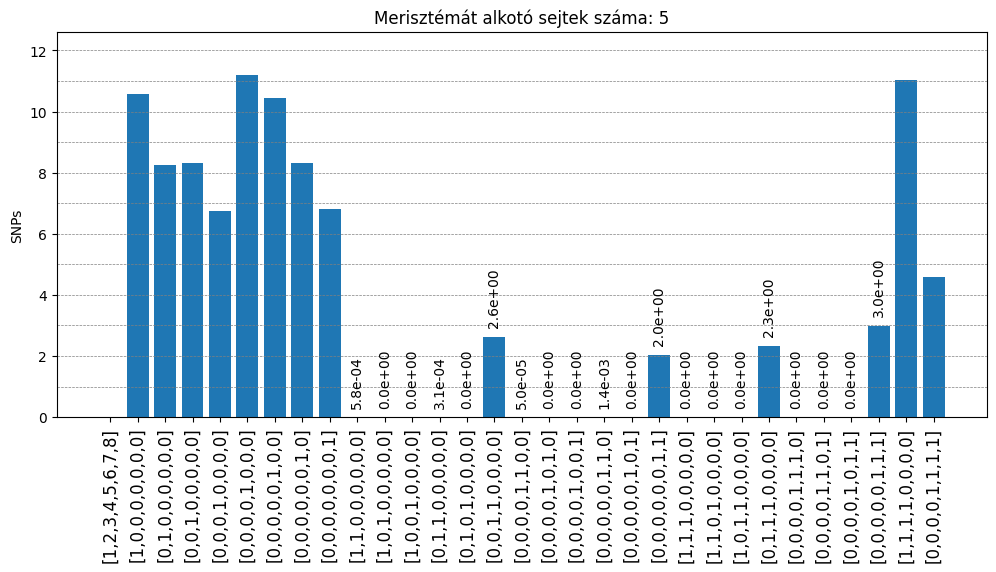

In [22]:
all_in_all = [  0,
                avg_tree_14[0], avg_tree_14[1], avg_tree_14[2], avg_tree_14[3],
                avg_tree_13[0], avg_tree_13[1], avg_tree_13[2], avg_tree_13[3],
                avg_tree_14[4], avg_tree_14[5], avg_tree_14[6], avg_tree_14[7], avg_tree_14[8], avg_tree_14[9],
                avg_tree_13[4], avg_tree_13[5], avg_tree_13[6], avg_tree_13[7], avg_tree_13[8], avg_tree_13[9],
                avg_tree_14[10], avg_tree_14[11], avg_tree_14[12], avg_tree_14[13],
                avg_tree_13[10], avg_tree_13[11], avg_tree_13[12], avg_tree_13[13],
                avg_tree_14[14],
                avg_tree_13[14]]
x_values = ['[1,2,3,4,5,6,7,8]',
            '[1,0,0,0,0,0,0,0]', '[0,1,0,0,0,0,0,0]', '[0,0,1,0,0,0,0,0]', '[0,0,0,1,0,0,0,0]',
            '[0,0,0,0,1,0,0,0]', '[0,0,0,0,0,1,0,0]', '[0,0,0,0,0,0,1,0]', '[0,0,0,0,0,0,0,1]',
            '[1,1,0,0,0,0,0,0]', '[1,0,1,0,0,0,0,0]', '[1,0,0,1,0,0,0,0]', '[0,1,1,0,0,0,0,0]', '[0,1,0,1,0,0,0,0]', '[0,0,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,0,0]', '[0,0,0,0,1,0,1,0]', '[0,0,0,0,1,0,0,1]', '[0,0,0,0,0,1,1,0]', '[0,0,0,0,0,1,0,1]', '[0,0,0,0,0,0,1,1]',
            '[1,1,1,0,0,0,0,0]', '[1,1,0,1,0,0,0,0]', '[1,0,1,1,0,0,0,0]', '[0,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,0]', '[0,0,0,0,1,1,0,1]', '[0,0,0,0,1,0,1,1]', '[0,0,0,0,0,1,1,1]',
            '[1,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,1]']

fig, ax = plt.subplots(figsize = (12,5))
ax.bar(x_values, all_in_all)
plt.xticks(rotation = 90, fontsize=12)
annotated_indices = [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
for i in annotated_indices:
    freq = all_in_all[i]
    ax.text(i, freq+0.3, f'{freq:.1e}', ha='center', va='bottom', fontsize=10, color='black', rotation = 90)
for y_value in range(1, math.ceil(max(all_in_all))+1):
    ax.axhline(y=y_value, color='gray', linestyle='--', linewidth=0.5)
ax.set_title(f'Merisztémát alkotó sejtek száma: 5')
ax.set_ylabel('SNPs')
plt.savefig('Rendes_kivétel_5_sejt_100k_sim.png')
plt.show()

In [44]:
print(avg_tree_14)
print(avg_tree_13)


all_in_all = [  0,
                avg_tree_14[0], avg_tree_14[1], avg_tree_14[2], avg_tree_14[3],
                avg_tree_13[0], avg_tree_13[1], avg_tree_13[2], avg_tree_13[3],
                avg_tree_14[4], avg_tree_14[5], avg_tree_14[6], avg_tree_14[7], avg_tree_14[8], avg_tree_14[9],
                avg_tree_13[4], avg_tree_13[5], avg_tree_13[6], avg_tree_13[7], avg_tree_13[8], avg_tree_13[9],
                avg_tree_14[10], avg_tree_14[11], avg_tree_14[12], avg_tree_14[13],
                avg_tree_13[10], avg_tree_13[11], avg_tree_13[12], avg_tree_13[13],
                avg_tree_14[14],
                avg_tree_13[14]]
print(all_in_all)

[1.4054e+01 1.0725e+01 1.0722e+01 9.8690e+00 5.0000e-03 0.0000e+00
 0.0000e+00 0.0000e+00 1.0000e-03 3.6430e+00 0.0000e+00 0.0000e+00
 1.0000e-03 3.2500e+00 1.5261e+01]
[1.4851e+01 1.3527e+01 1.0695e+01 1.0061e+01 1.0000e-03 0.0000e+00
 0.0000e+00 3.0000e-03 7.0000e-03 2.9080e+00 0.0000e+00 0.0000e+00
 0.0000e+00 4.2140e+00 6.0380e+00]
[0, 14.054, 10.725, 10.722, 9.869, 14.851, 13.527, 10.695, 10.061, 0.005, 0.0, 0.0, 0.0, 0.001, 3.643, 0.001, 0.0, 0.0, 0.003, 0.007, 2.908, 0.0, 0.0, 0.001, 3.25, 0.0, 0.0, 0.0, 4.214, 15.261, 6.038]


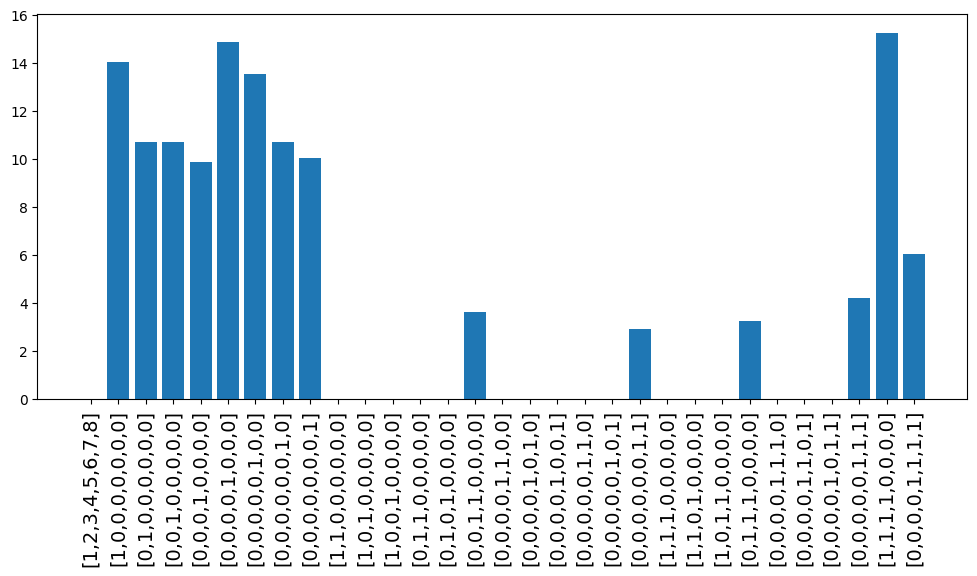

In [45]:

x_values = ['[1,2,3,4,5,6,7,8]',
            '[1,0,0,0,0,0,0,0]', '[0,1,0,0,0,0,0,0]', '[0,0,1,0,0,0,0,0]', '[0,0,0,1,0,0,0,0]',
            '[0,0,0,0,1,0,0,0]', '[0,0,0,0,0,1,0,0]', '[0,0,0,0,0,0,1,0]', '[0,0,0,0,0,0,0,1]',
            '[1,1,0,0,0,0,0,0]', '[1,0,1,0,0,0,0,0]', '[1,0,0,1,0,0,0,0]', '[0,1,1,0,0,0,0,0]', '[0,1,0,1,0,0,0,0]', '[0,0,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,0,0]', '[0,0,0,0,1,0,1,0]', '[0,0,0,0,1,0,0,1]', '[0,0,0,0,0,1,1,0]', '[0,0,0,0,0,1,0,1]', '[0,0,0,0,0,0,1,1]',
            '[1,1,1,0,0,0,0,0]', '[1,1,0,1,0,0,0,0]', '[1,0,1,1,0,0,0,0]', '[0,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,0]', '[0,0,0,0,1,1,0,1]', '[0,0,0,0,1,0,1,1]', '[0,0,0,0,0,1,1,1]',
            '[1,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,1]']

fig, ax = plt.subplots(figsize = (12,5))
ax.bar(x_values, all_in_all)
plt.xticks(rotation = 90, fontsize=14)
plt.show()

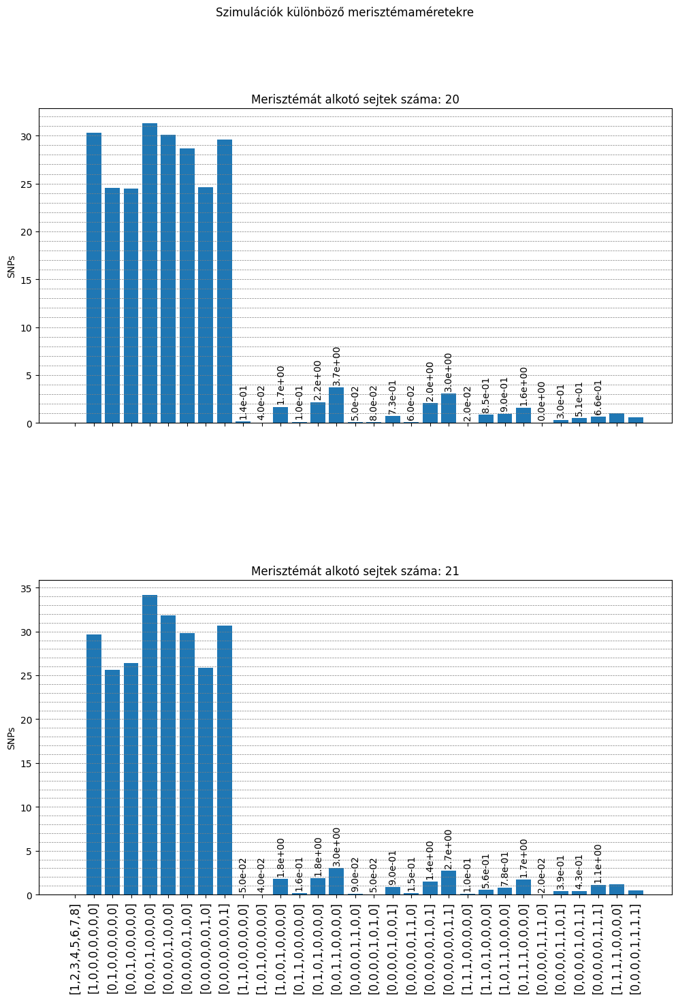

In [15]:
fig = plt.figure(figsize = (12,15))
gs = fig.add_gridspec(2, hspace = 0.5)
ax = gs.subplots(sharex = True)

x_values = ['[1,2,3,4,5,6,7,8]',
            '[1,0,0,0,0,0,0,0]', '[0,1,0,0,0,0,0,0]', '[0,0,1,0,0,0,0,0]', '[0,0,0,1,0,0,0,0]',
            '[0,0,0,0,1,0,0,0]', '[0,0,0,0,0,1,0,0]', '[0,0,0,0,0,0,1,0]', '[0,0,0,0,0,0,0,1]',
            '[1,1,0,0,0,0,0,0]', '[1,0,1,0,0,0,0,0]', '[1,0,0,1,0,0,0,0]', '[0,1,1,0,0,0,0,0]', '[0,1,0,1,0,0,0,0]', '[0,0,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,0,0]', '[0,0,0,0,1,0,1,0]', '[0,0,0,0,1,0,0,1]', '[0,0,0,0,0,1,1,0]', '[0,0,0,0,0,1,0,1]', '[0,0,0,0,0,0,1,1]',
            '[1,1,1,0,0,0,0,0]', '[1,1,0,1,0,0,0,0]', '[1,0,1,1,0,0,0,0]', '[0,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,0]', '[0,0,0,0,1,1,0,1]', '[0,0,0,0,1,0,1,1]', '[0,0,0,0,0,1,1,1]',
            '[1,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,1]']

for n in range(20,22):
    tree_13_res = np.zeros(15)
    tree_14_res = np.zeros(15)
    for i in range(100):
        sim = DFS(newick.loads(newick_tree)[0], n, [None], [1], [], [[[]]*n,[], 1], [], [])
        sim.pop()
        tree_14_mut = sim[0:4]
        tree_13_mut = sim[4:8]  
        tree_14_res += np.array(fun(tree_14_mut))
        tree_13_res += np.array(fun(tree_13_mut))

    avg_tree_14 = tree_14_res/100
    avg_tree_13 = tree_13_res/100

    all_in_all = [  0,
                avg_tree_14[0], avg_tree_14[1], avg_tree_14[2], avg_tree_14[3],
                avg_tree_13[0], avg_tree_13[1], avg_tree_13[2], avg_tree_13[3],
                avg_tree_14[4], avg_tree_14[5], avg_tree_14[6], avg_tree_14[7], avg_tree_14[8], avg_tree_14[9],
                avg_tree_13[4], avg_tree_13[5], avg_tree_13[6], avg_tree_13[7], avg_tree_13[8], avg_tree_13[9],
                avg_tree_14[10], avg_tree_14[11], avg_tree_14[12], avg_tree_14[13],
                avg_tree_13[10], avg_tree_13[11], avg_tree_13[12], avg_tree_13[13],
                avg_tree_14[14],
                avg_tree_13[14]]
    ax[n-20].bar(x_values, all_in_all)
    ax[n-20].set_title(f'Merisztémát alkotó sejtek száma: {n}')
    ax[n-20].set_ylabel('SNPs')
    fig.suptitle('Szimulációk különböző merisztémaméretekre')
    plt.xticks(rotation = 90, fontsize=12)
    annotated_indices = [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
    for i in annotated_indices:
        freq = all_in_all[i]
        ax[n-20].text(i, freq+0.3, f'{freq:.1e}', ha='center', va='bottom', fontsize=10, color='black', rotation = 90)
    for y_value in range(1, math.ceil(max(all_in_all))+1):
        ax[n-20].axhline(y=y_value, color='gray', linestyle='--', linewidth=0.5)
plt.show()

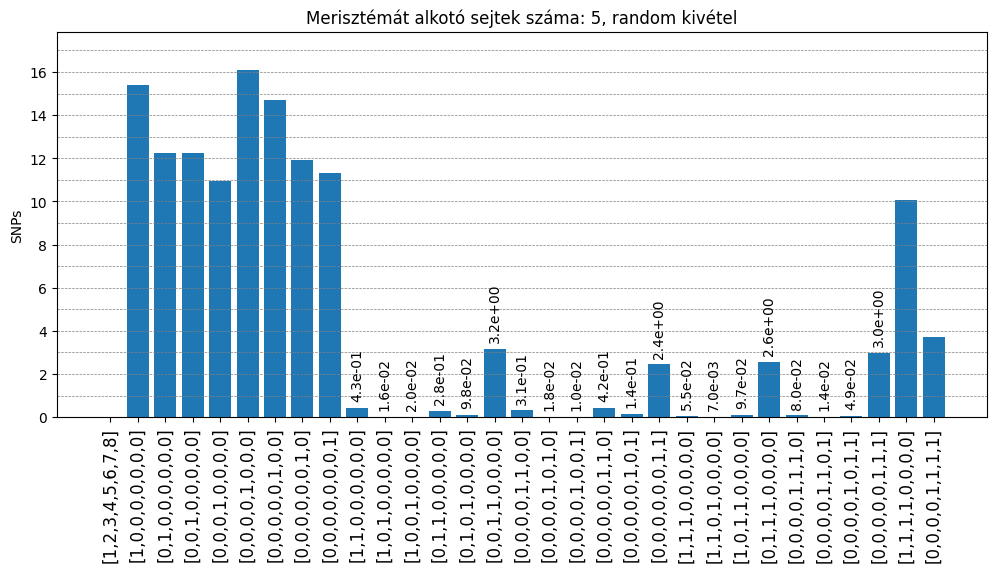

In [18]:
tree_13_res = np.zeros(15)
tree_14_res = np.zeros(15)
for i in range(1000):
    sim = DFS(newick.loads(newick_tree)[0], 5, [None], [1], [], [[[],[],[],[],[]],[], 1], [], [])
    sim.pop()
    tree_14_mut = sim[0:4]
    #print(tree_14_mut)
    tree_13_mut = sim[4:8]  
    #print(tree_13_mut)
    tree_14_res += np.array(fun(tree_14_mut))
    #print(tree_14_res)
    tree_13_res += np.array(fun(tree_13_mut))
    #print(tree_13_res)

avg_tree_14 = tree_14_res/1000
avg_tree_13 = tree_13_res/1000
all_in_all = [  0,
                avg_tree_14[0], avg_tree_14[1], avg_tree_14[2], avg_tree_14[3],
                avg_tree_13[0], avg_tree_13[1], avg_tree_13[2], avg_tree_13[3],
                avg_tree_14[4], avg_tree_14[5], avg_tree_14[6], avg_tree_14[7], avg_tree_14[8], avg_tree_14[9],
                avg_tree_13[4], avg_tree_13[5], avg_tree_13[6], avg_tree_13[7], avg_tree_13[8], avg_tree_13[9],
                avg_tree_14[10], avg_tree_14[11], avg_tree_14[12], avg_tree_14[13],
                avg_tree_13[10], avg_tree_13[11], avg_tree_13[12], avg_tree_13[13],
                avg_tree_14[14],
                avg_tree_13[14]]
x_values = ['[1,2,3,4,5,6,7,8]',
            '[1,0,0,0,0,0,0,0]', '[0,1,0,0,0,0,0,0]', '[0,0,1,0,0,0,0,0]', '[0,0,0,1,0,0,0,0]',
            '[0,0,0,0,1,0,0,0]', '[0,0,0,0,0,1,0,0]', '[0,0,0,0,0,0,1,0]', '[0,0,0,0,0,0,0,1]',
            '[1,1,0,0,0,0,0,0]', '[1,0,1,0,0,0,0,0]', '[1,0,0,1,0,0,0,0]', '[0,1,1,0,0,0,0,0]', '[0,1,0,1,0,0,0,0]', '[0,0,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,0,0]', '[0,0,0,0,1,0,1,0]', '[0,0,0,0,1,0,0,1]', '[0,0,0,0,0,1,1,0]', '[0,0,0,0,0,1,0,1]', '[0,0,0,0,0,0,1,1]',
            '[1,1,1,0,0,0,0,0]', '[1,1,0,1,0,0,0,0]', '[1,0,1,1,0,0,0,0]', '[0,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,0]', '[0,0,0,0,1,1,0,1]', '[0,0,0,0,1,0,1,1]', '[0,0,0,0,0,1,1,1]',
            '[1,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,1]']

fig, ax = plt.subplots(figsize = (12,5))
ax.bar(x_values, all_in_all)
plt.xticks(rotation = 90, fontsize=12)
annotated_indices = [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
for i in annotated_indices:
    freq = all_in_all[i]
    ax.text(i, freq+0.3, f'{freq:.1e}', ha='center', va='bottom', fontsize=10, color='black', rotation = 90)
for y_value in range(1, math.ceil(max(all_in_all))+1):
    ax.axhline(y=y_value, color='gray', linestyle='--', linewidth=0.5)
ax.set_title(f'Merisztémát alkotó sejtek száma: 5, random kivétel')
ax.set_ylabel('SNPs')
plt.savefig('Random_kivétel_5_sejt', format = 'png')
plt.show()

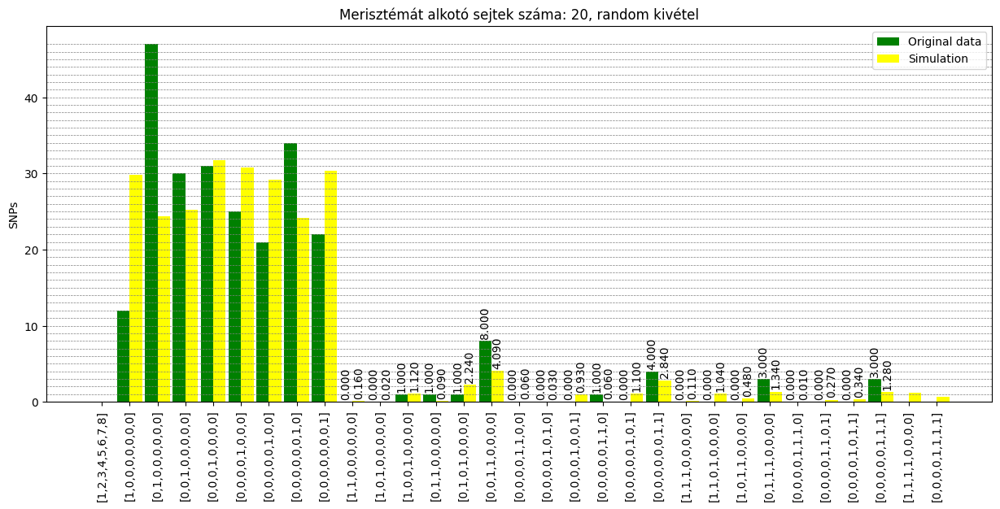

In [31]:
tree_13_res = np.zeros(15)
tree_14_res = np.zeros(15)
for i in range(100):
    sim = DFS(newick.loads(newick_tree)[0], 20, [None], [1], [], [[[]]*20,[], 1], [], [])
    sim.pop()
    tree_14_mut = sim[0:4]
    #print(tree_14_mut)
    tree_13_mut = sim[4:8]  
    #print(tree_13_mut)
    tree_14_res += np.array(fun(tree_14_mut))
    #print(tree_14_res)
    tree_13_res += np.array(fun(tree_13_mut))
    #print(tree_13_res)

avg_tree_14 = tree_14_res/100
avg_tree_13 = tree_13_res/100

y_values = [0, 12, 47, 30, 31, 25, 21, 34, 22, 0, 0, 1, 1, 1, 8, 0, 0, 0, 1, 0, 4, 0, 0, 0, 3, 0, 0, 0, 3, 0, 0 ]

y_values_sim = [ 0, avg_tree_14[0], avg_tree_14[1], avg_tree_14[2], avg_tree_14[3],
                 avg_tree_13[0], avg_tree_13[1], avg_tree_13[2], avg_tree_13[3],
                 avg_tree_14[4], avg_tree_14[5], avg_tree_14[6], avg_tree_14[7], avg_tree_14[8], avg_tree_14[9],
                 avg_tree_13[4], avg_tree_13[5], avg_tree_13[6], avg_tree_13[7], avg_tree_13[8], avg_tree_13[9],
                 avg_tree_14[10], avg_tree_14[11], avg_tree_14[12], avg_tree_14[13],
                 avg_tree_13[10], avg_tree_13[11], avg_tree_13[12], avg_tree_13[13],
                 avg_tree_14[14],
                 avg_tree_13[14]]

all_in_all = [  0,
                y_values[0], avg_tree_14[0], y_values[1], avg_tree_14[1], y_values[2], avg_tree_14[2], y_values[3], avg_tree_14[3],
                y_values[4], avg_tree_13[0], y_values[5], avg_tree_13[1], y_values[6], avg_tree_13[2], y_values[7], avg_tree_13[3],
                y_values[8], avg_tree_14[4], y_values[9], avg_tree_14[5], y_values[10], avg_tree_14[6], y_values[11], avg_tree_14[7], y_values[12], avg_tree_14[8], y_values[13], avg_tree_14[9],
                y_values[14], avg_tree_13[4], y_values[15], avg_tree_13[5], y_values[16], avg_tree_13[6], y_values[17], avg_tree_13[7], y_values[18], avg_tree_13[8], y_values[19], avg_tree_13[9],
                y_values[20], avg_tree_14[10], y_values[21], avg_tree_14[11], y_values[22], avg_tree_14[12], y_values[23], avg_tree_14[13],
                y_values[24], avg_tree_13[10], y_values[25], avg_tree_13[11], y_values[26], avg_tree_13[12], y_values[27], avg_tree_13[13],
                y_values[28], avg_tree_14[14],
                y_values[29], avg_tree_13[14]]



x_values = ['[1,2,3,4,5,6,7,8]',
            '[1,0,0,0,0,0,0,0]', '[0,1,0,0,0,0,0,0]', '[0,0,1,0,0,0,0,0]', '[0,0,0,1,0,0,0,0]',
            '[0,0,0,0,1,0,0,0]', '[0,0,0,0,0,1,0,0]', '[0,0,0,0,0,0,1,0]', '[0,0,0,0,0,0,0,1]',
            '[1,1,0,0,0,0,0,0]', '[1,0,1,0,0,0,0,0]', '[1,0,0,1,0,0,0,0]', '[0,1,1,0,0,0,0,0]', '[0,1,0,1,0,0,0,0]', '[0,0,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,0,0]', '[0,0,0,0,1,0,1,0]', '[0,0,0,0,1,0,0,1]', '[0,0,0,0,0,1,1,0]', '[0,0,0,0,0,1,0,1]', '[0,0,0,0,0,0,1,1]',
            '[1,1,1,0,0,0,0,0]', '[1,1,0,1,0,0,0,0]', '[1,0,1,1,0,0,0,0]', '[0,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,0]', '[0,0,0,0,1,1,0,1]', '[0,0,0,0,1,0,1,1]', '[0,0,0,0,0,1,1,1]',
            '[1,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,1]']

width = 0.45
x_positions = np.arange(len(x_values))

fig, ax = plt.subplots(figsize = (15,6))
bar1 = ax.bar(x_positions - width/2, y_values, width, color = 'green', label = 'Original data')
bar2 = ax.bar(x_positions + width/2, y_values_sim, width, color = 'yellow', label = 'Simulation')
ax.set_xticks(x_positions)
ax.set_xticklabels(x_values, rotation = 90)

for i in range(9,29):
    ax.text(x_positions[i] - width/2, y_values[i] + 0.3, f'{y_values[i]:.3f}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)
    ax.text(x_positions[i] + width/2, y_values_sim[i] + 0.3, f'{y_values_sim[i]:.3f}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)   
#for i, freq in enumerate(y_values):
#    ax.text(x_positions[i] - width/2, freq + 0.3, f'{freq:.1e}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)
#for i, freq in enumerate(y_values_sim):
#    ax.text(x_positions[i] + width/2, freq + 0.3, f'{freq:.1e}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)

# Add horizontal grid lines

#annotated_indices = [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
#for i in range(9,49):
#    freq = all_in_all[i]
#    ax.text(i, freq+0.3, f'{freq:.1e}', ha='center', va='bottom', fontsize=10, color='black', rotation = 90)

for y_value in range(1, math.ceil(max(all_in_all))+1):
    ax.axhline(y = y_value, color = 'gray', linestyle = '--', linewidth=0.5)
ax.set_title(f'Merisztémát alkotó sejtek száma: 20, random kivétel')
ax.set_ylabel('SNPs')
ax.legend()
#plt.savefig('Random_kivétel_5_sejt', format = 'png')
plt.show()

# Innen az jön, hogy nem mindegyik sejt mutációit nézem, hanem mindig random kiválasztok 1-et a populációból és csak azt hasonlítom össze a többivel

In [15]:
def flatten_chain(matrix):
    return list(chain.from_iterable(matrix))

def remove(my_list, my_set):
    for element in my_set:
        if element in my_list:
            my_list.remove(element)
    return my_list

def fun(nested_list):

    list1 = nested_list[0]
    list2 = nested_list[1]
    list3 = nested_list[2]
    list4 = nested_list[3]

    set1 = set(list1)
    set2 = set(list2)
    set3 = set(list3)
    set4 = set(list4)

    found_in_all = set1 & set2 & set3 & set4
    num_found_in_all = len(found_in_all)
    set1.difference_update(found_in_all)
    set2.difference_update(found_in_all)
    set3.difference_update(found_in_all)
    set4.difference_update(found_in_all)

    found_in_123 = set1 & set2 & set3
    num_found_in_123 = len(found_in_123)
    set1.difference_update(found_in_123)
    set2.difference_update(found_in_123)
    set3.difference_update(found_in_123)

    found_in_124 = set1 & set2 & set4
    num_found_in_124 = len(found_in_124)
    set1.difference_update(found_in_124)
    set2.difference_update(found_in_124)
    set4.difference_update(found_in_124)

    found_in_134 = set1 & set3 & set4
    num_found_in_134 = len(found_in_134)
    set1.difference_update(found_in_134)
    set3.difference_update(found_in_134)
    set4.difference_update(found_in_134)

    found_in_234 = set2 & set3 & set4
    num_found_in_234 = len(found_in_234)
    set2.difference_update(found_in_234)
    set3.difference_update(found_in_234)
    set4.difference_update(found_in_234)

    found_in_12 = set1 & set2
    num_found_in_12 = len(found_in_12)
    set1.difference_update(found_in_12)
    set2.difference_update(found_in_12)

    found_in_13 = set1 & set3
    num_found_in_13 = len(found_in_13)
    set1.difference_update(found_in_13)
    set3.difference_update(found_in_13)

    found_in_14 = set1 & set4
    num_found_in_14 = len(found_in_14)
    set1.difference_update(found_in_14)
    set4.difference_update(found_in_14)

    found_in_23 = set2 & set3
    num_found_in_23 = len(found_in_23)
    set2.difference_update(found_in_23)
    set3.difference_update(found_in_23)

    found_in_24 = set2 & set4
    num_found_in_24 = len(found_in_24)
    set2.difference_update(found_in_24)
    set4.difference_update(found_in_24)

    found_in_34 = set3 & set4
    num_found_in_34 = len(found_in_34)
    set3.difference_update(found_in_34)
    set4.difference_update(found_in_34)

    found_in_1 = set1
    num_found_in_1 = len(found_in_1)
    found_in_2 = set2
    num_found_in_2 = len(found_in_2)
    found_in_3 = set3
    num_found_in_3 = len(found_in_3)
    found_in_4 = set4
    num_found_in_4 = len(found_in_4)

    return num_found_in_1, num_found_in_2, num_found_in_3, num_found_in_4, num_found_in_12, num_found_in_13, num_found_in_14, num_found_in_23, num_found_in_24, num_found_in_34, num_found_in_123, num_found_in_124, num_found_in_134, num_found_in_234, num_found_in_all


In [16]:
"""
fig, ax = plt.subplots(23, figsize=(12, 5), sharex=True)
fig.tight_layout()

x_values = ['[1,2,3,4,5,6,7,8]',
            '[1,0,0,0,0,0,0,0]', '[0,1,0,0,0,0,0,0]', '[0,0,1,0,0,0,0,0]', '[0,0,0,1,0,0,0,0]',
            '[0,0,0,0,1,0,0,0]', '[0,0,0,0,0,1,0,0]', '[0,0,0,0,0,0,1,0]', '[0,0,0,0,0,0,0,1]',
            '[1,1,0,0,0,0,0,0]', '[1,0,1,0,0,0,0,0]', '[1,0,0,1,0,0,0,0]', '[0,1,1,0,0,0,0,0]', '[0,1,0,1,0,0,0,0]', '[0,0,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,0,0]', '[0,0,0,0,1,0,1,0]', '[0,0,0,0,1,0,0,1]', '[0,0,0,0,0,1,1,0]', '[0,0,0,0,0,1,0,1]', '[0,0,0,0,0,0,1,1]',
            '[1,1,1,0,0,0,0,0]', '[1,1,0,1,0,0,0,0]', '[1,0,1,1,0,0,0,0]', '[0,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,0]', '[0,0,0,0,1,1,0,1]', '[0,0,0,0,1,0,1,1]', '[0,0,0,0,0,1,1,1]',
            '[1,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,1]']
width = 0.45
x_positions = np.arange(len(x_values))
y_values = [0, 12, 47, 30, 31, 25, 21, 34, 22, 0, 0, 1, 1, 1, 8, 0, 0, 0, 1, 0, 4, 0, 0, 0, 3, 0, 0, 0, 3, 0, 0 ]
"""

final_tree_14 = []
final_tree_13 = []


for n in range(3,26):
    tree_13_res = np.zeros(15)
    tree_14_res = np.zeros(15)
    for i in range(1000):
        sim = DFS(newick.loads(newick_tree)[0], n, [None], [1], [], [[[]]*n,[], 1], [], [])
        sim.pop()

        tree_14_mut = [rd.choice(sim[0]), rd.choice(sim[1]), rd.choice(sim[2]), rd.choice(sim[3])]
        tree_13_mut = [rd.choice(sim[4]), rd.choice(sim[5]), rd.choice(sim[6]), rd.choice(sim[7])]
        tree_14_res += np.array(fun(tree_14_mut))
        tree_13_res += np.array(fun(tree_13_mut))

    avg_tree_14 = tree_14_res/1000
    avg_tree_13 = tree_13_res/1000
    
    final_tree_14.append(avg_tree_14)
    final_tree_13.append(avg_tree_13)
    """
    #y_values_sim = [ 0, avg_tree_14[0], avg_tree_14[1], avg_tree_14[2], avg_tree_14[3],
    #                avg_tree_13[0], avg_tree_13[1], avg_tree_13[2], avg_tree_13[3],
    #                avg_tree_14[4], avg_tree_14[5], avg_tree_14[6], avg_tree_14[7], avg_tree_14[8], avg_tree_14[9],
    #                avg_tree_13[4], avg_tree_13[5], avg_tree_13[6], avg_tree_13[7], avg_tree_13[8], avg_tree_13[9],
    #                avg_tree_14[10], avg_tree_14[11], avg_tree_14[12], avg_tree_14[13],
    #                avg_tree_13[10], avg_tree_13[11], avg_tree_13[12], avg_tree_13[13],
    #                avg_tree_14[14],
    #                avg_tree_13[14]]

    #all_in_all = [  0,
    #                y_values[0], avg_tree_14[0], y_values[1], avg_tree_14[1], y_values[2], avg_tree_14[2], y_values[3], avg_tree_14[3],
                    y_values[4], avg_tree_13[0], y_values[5], avg_tree_13[1], y_values[6], avg_tree_13[2], y_values[7], avg_tree_13[3],
                    y_values[8], avg_tree_14[4], y_values[9], avg_tree_14[5], y_values[10], avg_tree_14[6], y_values[11], avg_tree_14[7], y_values[12], avg_tree_14[8], y_values[13], avg_tree_14[9],
                    y_values[14], avg_tree_13[4], y_values[15], avg_tree_13[5], y_values[16], avg_tree_13[6], y_values[17], avg_tree_13[7], y_values[18], avg_tree_13[8], y_values[19], avg_tree_13[9],
                    y_values[20], avg_tree_14[10], y_values[21], avg_tree_14[11], y_values[22], avg_tree_14[12], y_values[23], avg_tree_14[13],
                    y_values[24], avg_tree_13[10], y_values[25], avg_tree_13[11], y_values[26], avg_tree_13[12], y_values[27], avg_tree_13[13],
                    y_values[28], avg_tree_14[14],
                    y_values[29], avg_tree_13[14]]




    bar1 = ax[n-3].bar(x_positions - width/2, y_values, width, color = 'green', label = 'Original data')
    bar2 = ax[n-3].bar(x_positions + width/2, y_values_sim, width, color = 'yellow', label = 'Simulation')
    ax[n-3].set_xticks(x_positions)
    ax[n-3].set_xticklabels(x_values, rotation = 90)

    for i in range(9,29):
        ax[n-3].text(x_positions[i] - width/2, y_values[i] + 0.3, f'{y_values[i]:.3f}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)
        ax[n-3].text(x_positions[i] + width/2, y_values_sim[i] + 0.3, f'{y_values_sim[i]:.3f}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)   

    ax[n-3].set_title(f'Merisztémát alkotó sejtek száma: {n}, random kivétel')
    ax[n-3].set_ylabel('SNPs')
    ax[n-3].legend()
    #plt.savefig('Random_kivétel_5_sejt', format = 'png')
plt.show()
"""


In [33]:
def pairing(l_14, l_13):
    y = [ 0, l_14[0], l_14[1], l_14[2], l_14[3],
                    l_13[0], l_13[1], l_13[2], l_13[3],
                    l_14[4], l_14[5], l_14[6], l_14[7], l_14[8], l_14[9],
                    l_13[4], l_13[5], l_13[6], l_13[7], l_13[8], l_13[9],
                    l_14[10], l_14[11], l_14[12], l_14[13],
                    l_13[10], l_13[11], l_13[12], l_13[13],
                    l_14[14],
                    l_13[14]]
    return y

In [62]:
def plotting(tree_14, tree_13,):
    fig, ax = plt.subplots(1, figsize=(12, 5))

    x_values = ['[1,2,3,4,5,6,7,8]',
                '[1,0,0,0,0,0,0,0]', '[0,1,0,0,0,0,0,0]', '[0,0,1,0,0,0,0,0]', '[0,0,0,1,0,0,0,0]',
                '[0,0,0,0,1,0,0,0]', '[0,0,0,0,0,1,0,0]', '[0,0,0,0,0,0,1,0]', '[0,0,0,0,0,0,0,1]',
                '[1,1,0,0,0,0,0,0]', '[1,0,1,0,0,0,0,0]', '[1,0,0,1,0,0,0,0]', '[0,1,1,0,0,0,0,0]', '[0,1,0,1,0,0,0,0]', '[0,0,1,1,0,0,0,0]',
                '[0,0,0,0,1,1,0,0]', '[0,0,0,0,1,0,1,0]', '[0,0,0,0,1,0,0,1]', '[0,0,0,0,0,1,1,0]', '[0,0,0,0,0,1,0,1]', '[0,0,0,0,0,0,1,1]',
                '[1,1,1,0,0,0,0,0]', '[1,1,0,1,0,0,0,0]', '[1,0,1,1,0,0,0,0]', '[0,1,1,1,0,0,0,0]',
                '[0,0,0,0,1,1,1,0]', '[0,0,0,0,1,1,0,1]', '[0,0,0,0,1,0,1,1]', '[0,0,0,0,0,1,1,1]',
                '[1,1,1,1,0,0,0,0]',
                '[0,0,0,0,1,1,1,1]']
    width = 0.45
    x_positions = np.arange(len(x_values))
    y_values = [0, 12, 47, 30, 31, 25, 21, 34, 22, 0, 0, 1, 1, 1, 8, 0, 0, 0, 1, 0, 4, 0, 0, 0, 3, 0, 0, 0, 3, 0, 0 ]
    y_values_sim = pairing(tree_14, tree_13)
    #y_values_sim = pairing(np.array(tree_14), np.array(tree_13))

    for i in range(9,29):
        ax.text(x_positions[i] - width/2, y_values[i] + 0.3, f'{y_values[i]:.3f}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)
        ax.text(x_positions[i] + width/2, y_values_sim[i] + 0.3, f'{y_values_sim[i]:.3f}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)  

    bar1 = ax.bar(x_positions - width/2, y_values, width, color = 'green', label = 'Original data')
    bar2 = ax.bar(x_positions + width/2, y_values_sim, width, color = 'yellow', label = 'Simulation')
    ax.set_xticks(x_positions)
    ax.set_xticklabels(x_values, rotation = 90)
    for y_value in range(1, math.ceil(max(y_values))+1):
        ax.axhline(y = y_value, color = 'gray', linestyle = '--', linewidth=0.5)
    ax.set_title(f'Mutációs ráta: {mutation_rates[p]}, Merisztéma populáció: {l+7} sejt, Moran lépések száma: {j+1}, random kivétel')
    ax.set_ylabel('SNPs')
    ax.legend()
    #plt.savefig('Random_kivétel_5_sejt', format = 'png')
    plt.show()


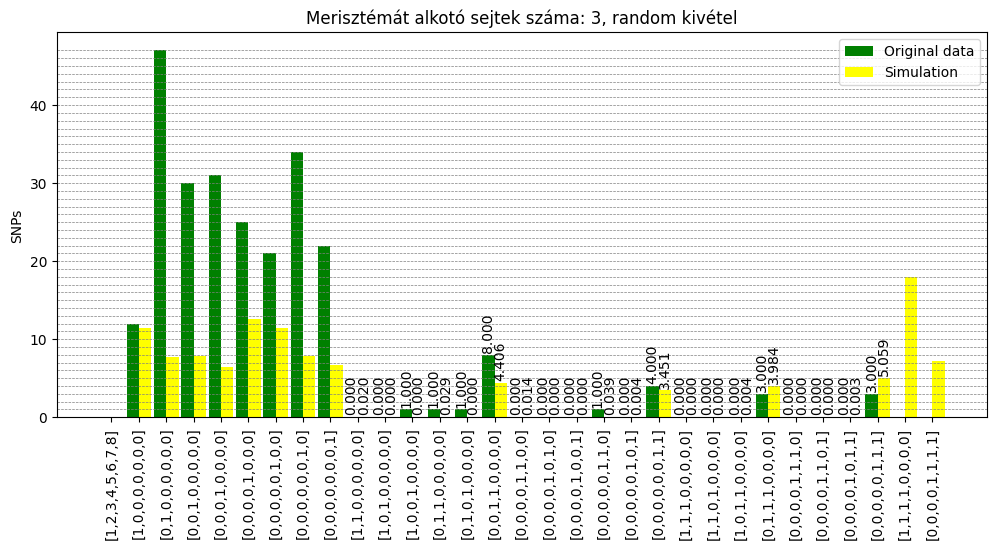

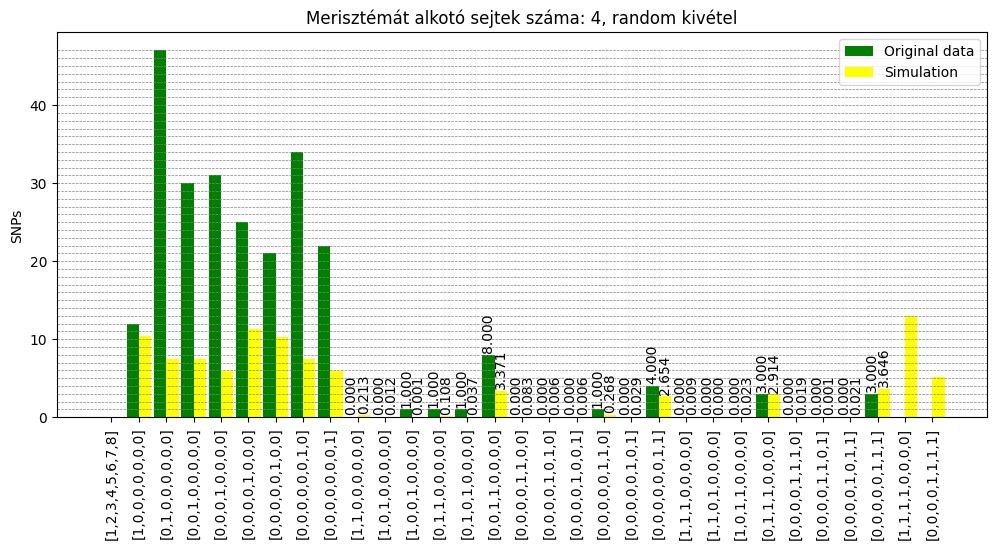

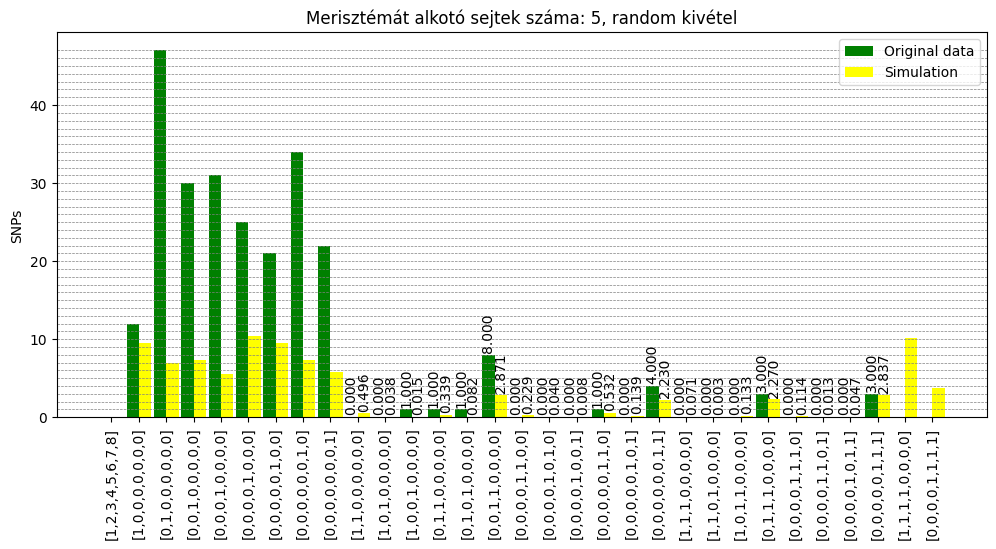

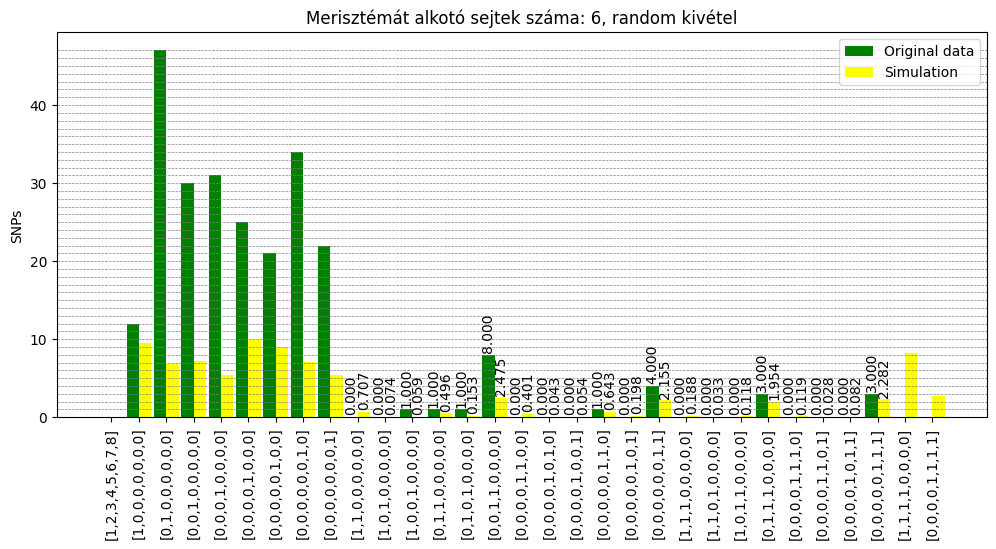

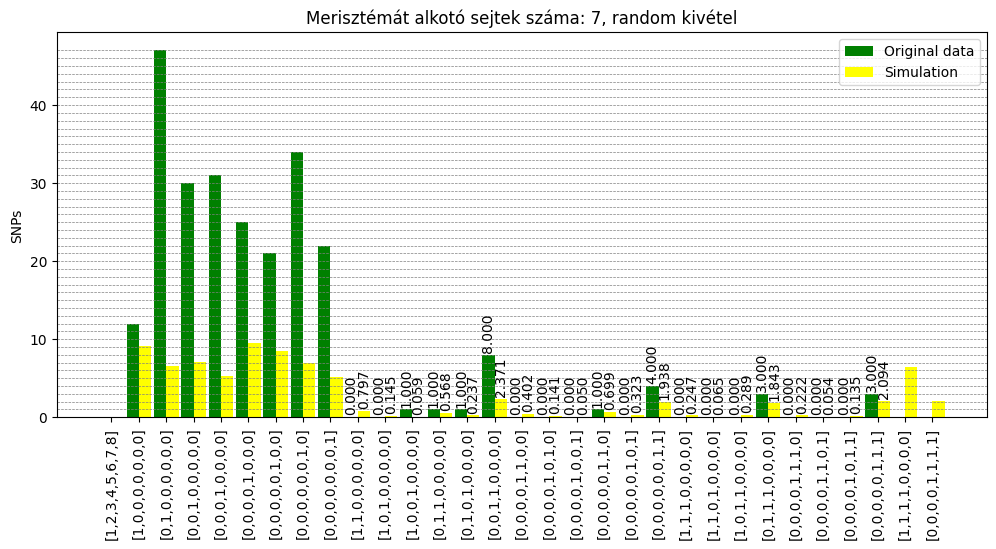

...

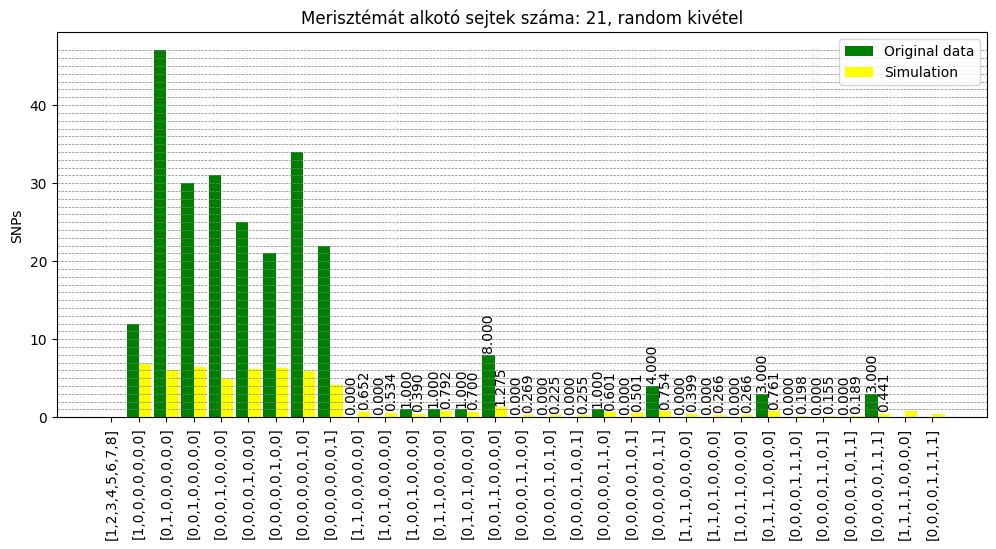

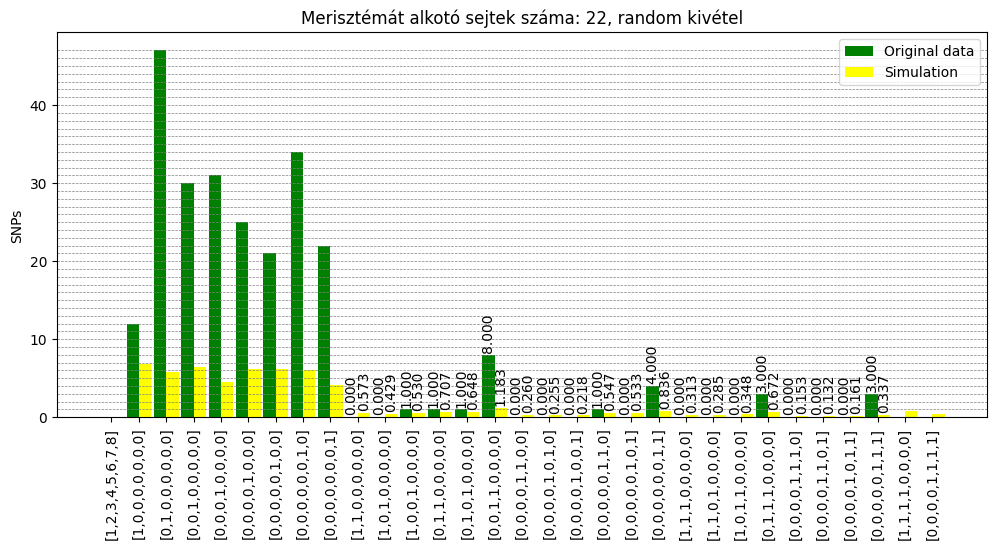

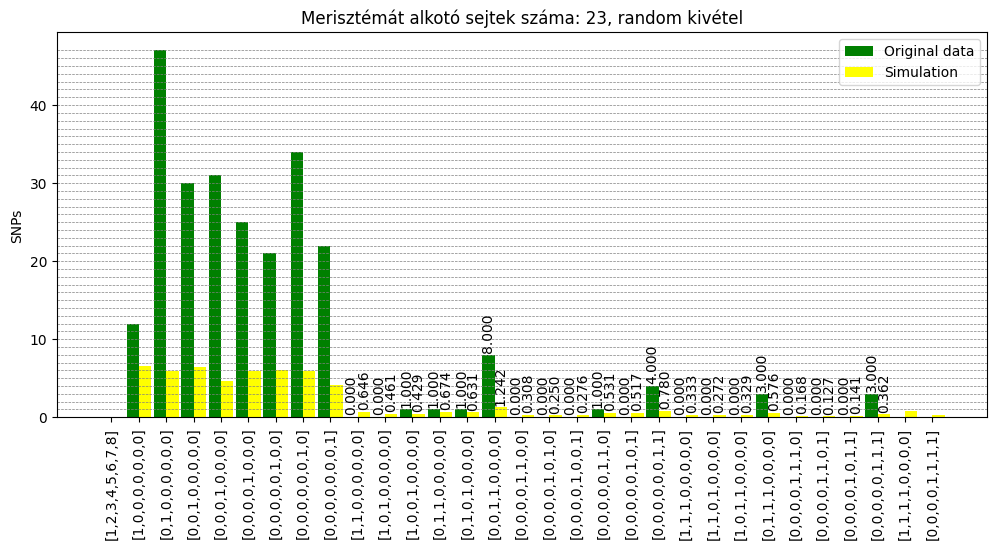

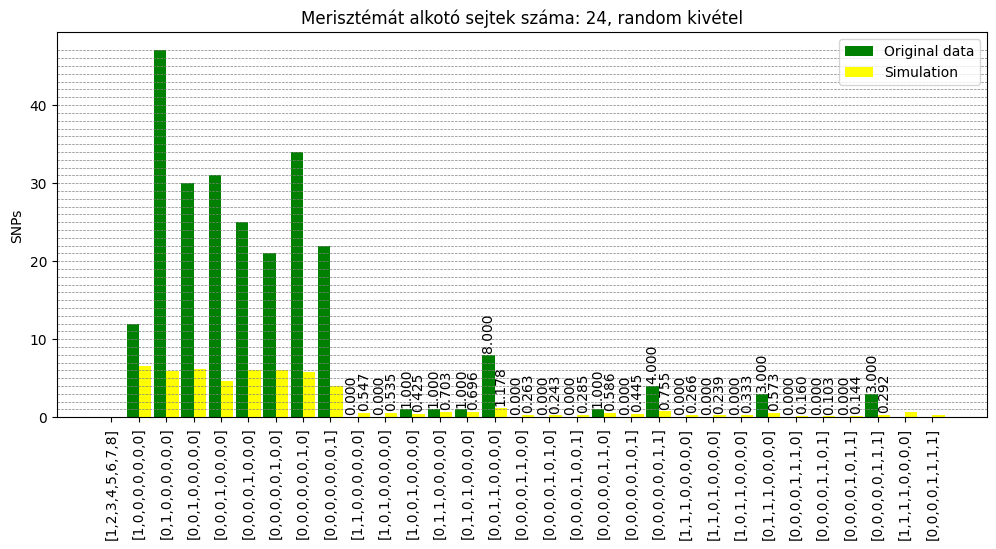

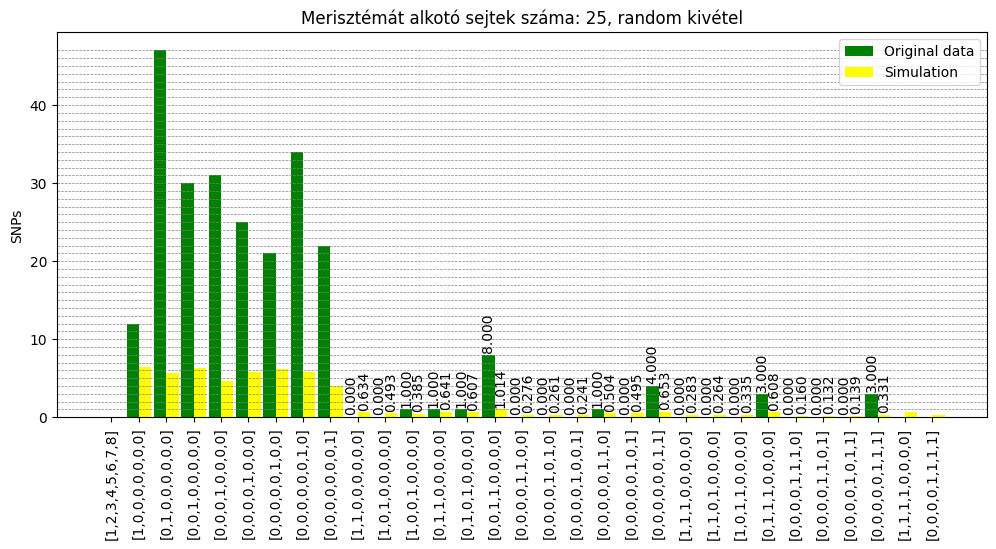

In [34]:
for j in range(23):
    plotting(final_tree_14[j], final_tree_13[j])

# Moran lépések változtatása

In [16]:
def simulate(to, n, starter_culture, starter_mutation, moran_steps_in_a_year): 
                                #bemenete: to -> lista, ami tartalmazza, hogy meddig megy és hol égazik
                                #n -> int, populáció mérete
                                #starter_culture -> lista, ami tartalmazza a mutációkat
                                #starter_mutation -> int, kezdeti mutációs szám
                                #moran_steps_in_a_year -> int, Moran lépések száma egy év alatt. 
    
    mutate_m = starter_mutation
    culture = deepcopy(starter_culture)
    branching_buds = []
    #print('Kezdeti populáció:', culture)
    #lim=int(to[-1]) #to utolsó eleme tartalmazza, hogy meddig menjen --> korábban
    lim = to
    if len(culture) == 1:
        culture, mutate_m=propagation(n,culture,mutate_m)
    for i in range(moran_steps_in_a_year * lim):
        #print(i)
        #print('\n','Populáció a(z)', i+1,'. Moran lépés kezdetén', culture)
        k = 1
        choices = choose_from_population(culture,k)
        #print('Sorszám osztódásra:',choices)
        duplicated_and_mutated, mutate_m = duplication_and_mutation(culture, choices, mutate_m)
        #print('Megkettőződtek és mutáltak',duplicated_and_mutated)
        after_creating_buds = deepcopy(creating_buds_random(duplicated_and_mutated, n)[0])
        #print('Rügyképzés után:',after_creating_buds)  
        if i == moran_steps_in_a_year * lim - 1:
            #branching_buds.append([deepcopy(creating_buds(duplicated_and_mutated)[1])])
            branching_buds=[deepcopy(creating_buds_random(duplicated_and_mutated, n)[1])]
        culture=deepcopy(after_creating_buds)
    #print('Kimeneti populáció', culture)
    #print('Rügy:', branching_buds)
    next_mutation = mutate_m
    return culture, branching_buds,next_mutation



def DFS(node, n, last_node_name, last_node_children_number,  brain_list, starter_list, results, end_of_branch, moran_steps):
    lengths = []
    last_node_name.append(node.name)
    a = node.length
    children = node.descendants[::-1]
    last_node_children_number.append(len(children))
    #print('\n')
    #print('Az előző node neve:',last_node_name[-2])
    #print('Előző node gyerekek száma:', last_node_children_number[-2])
    #print('\n')
    #print('Ezen a node-on vagyunk:', node.name)
    #print('Node hossza:', node.length)
    #print('Ennyi gyereke van:', len(children))
    #print('\n')
    if len(children) == 2 and last_node_children_number[-2] == 2:
        res = simulate(int(a), n , starter_list[1], starter_list[2], moran_steps)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        brain_list.append(res[0])

    elif len(children) == 2 and last_node_children_number[-2] == 1:
        res = simulate(int(a), n , starter_list[0], starter_list[2], moran_steps)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        brain_list.append(res[0])

    elif len(children) == 1 and last_node_children_number[-2] == 2:
        res = simulate(int(a), n , starter_list[1], starter_list[2], moran_steps)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]

    elif len(children) == 1 and last_node_children_number[-2] == 1:
        res = simulate(int(a), n , starter_list[0], starter_list[2], moran_steps)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]

    elif len(children) == 2 and last_node_children_number[-2] == 0:
        res = simulate(int(a), n , brain_list[-1], starter_list[2], moran_steps)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        if len(brain_list) != 0:
            brain_list.pop() 
        brain_list.append(res[0])


    elif len(children) == 1 and last_node_children_number[-2] == 0: 
        res = simulate(int(a), n , brain_list[-1], starter_list[2], moran_steps)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        if len(brain_list) != 0:
            brain_list.pop() 
    
    elif len(children) == 0 and last_node_children_number[-2] == 0:
        res = simulate(int(a), n , brain_list[-1], starter_list[2], moran_steps)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        end_of_branch.append(res[0])
        if len(brain_list) != 0:
            brain_list.pop() 
    
    elif len(children) == 0 and last_node_children_number[-2] == 1:
        res = simulate(int(a), n , starter_list[0], starter_list[2], moran_steps)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        end_of_branch.append(res[0])
    
    elif len(children) == 0 and last_node_children_number[-2] == 2: 
        res = simulate(int(a), n , starter_list[1], starter_list[2], moran_steps)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        end_of_branch.append(res[0])
    
    #print(brain_list)
    lengths.append(a)
    for descendants in node.descendants[::-1]:

        #if descendants.name != None:
        #    if len(brain_list) != 0:
        #        brain_list.pop() 
        kisebb_fa=DFS(descendants, n, last_node_name, last_node_children_number, brain_list, starter_list, results, end_of_branch, moran_steps)
        #lengths.append(kisebb_fa)

    return end_of_branch

In [27]:
sim = DFS(newick.loads(newick_tree)[0], 5, [None], [1], [], [[[]]*5,[], 1], [], [], moran_steps = 8)
print(sim)

[[[5, 7, 15, 27, 45, 59, 65, 73, 80, 104, 124, 131, 133, 135, 141, 145, 151, 157, 164, 187, 191, 193, 196, 202, 205, 210, 229, 240, 254, 273, 285, 286, 330, 332, 350, 372, 376, 377, 379, 401, 404, 427, 440, 450, 459, 461, 468, 473, 474, 476, 477, 479, 497, 504, 507, 508, 532, 542, 554, 555, 566, 575, 579, 581, 617, 628, 640, 643, 679, 692, 707, 708, 725, 767, 768, 777, 785, 787, 793, 799, 804, 819, 828, 843, 874, 879, 889, 892, 898, 900, 909, 919, 920, 923, 935, 949, 957, 969, 972, 977, 989, 990, 995, 1023, 1028, 1030, 1032, 1040, 1044, 1058, 1065, 1104, 1115, 1130, 1132, 1143, 1172, 1187, 1188, 1203, 1215, 1216, 1225, 1259, 1291, 1297, 1314, 1335], [5, 7, 15, 27, 45, 59, 65, 73, 80, 104, 124, 131, 133, 135, 141, 145, 151, 157, 164, 187, 191, 193, 196, 202, 205, 210, 229, 240, 254, 273, 285, 286, 330, 332, 350, 372, 376, 377, 379, 401, 404, 427, 440, 450, 459, 461, 468, 473, 474, 476, 477, 479, 497, 504, 507, 508, 532, 542, 554, 555, 566, 575, 579, 581, 617, 628, 640, 643, 679, 692, 70

In [28]:
final_tree_14 = []
final_tree_13 = []


for n in range(1,8):
    tree_13_res = np.zeros(15)
    tree_14_res = np.zeros(15)
    for i in range(100):
        sim = DFS(newick.loads(newick_tree)[0], 5, [None], [1], [], [[[]]*5,[], 1], [], [], moran_steps = n)
        sim.pop()

        tree_14_mut = [rd.choice(sim[0]), rd.choice(sim[1]), rd.choice(sim[2]), rd.choice(sim[3])]
        tree_13_mut = [rd.choice(sim[4]), rd.choice(sim[5]), rd.choice(sim[6]), rd.choice(sim[7])]
        tree_14_res += np.array(fun(tree_14_mut))
        tree_13_res += np.array(fun(tree_13_mut))

    avg_tree_14 = tree_14_res/100
    avg_tree_13 = tree_13_res/100
    
    final_tree_14.append(avg_tree_14)
    final_tree_13.append(avg_tree_13)

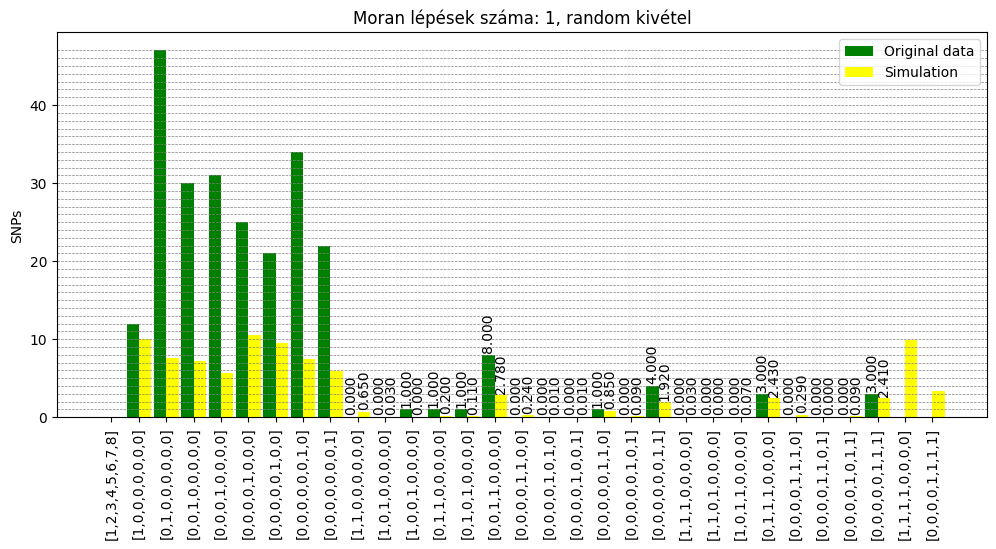

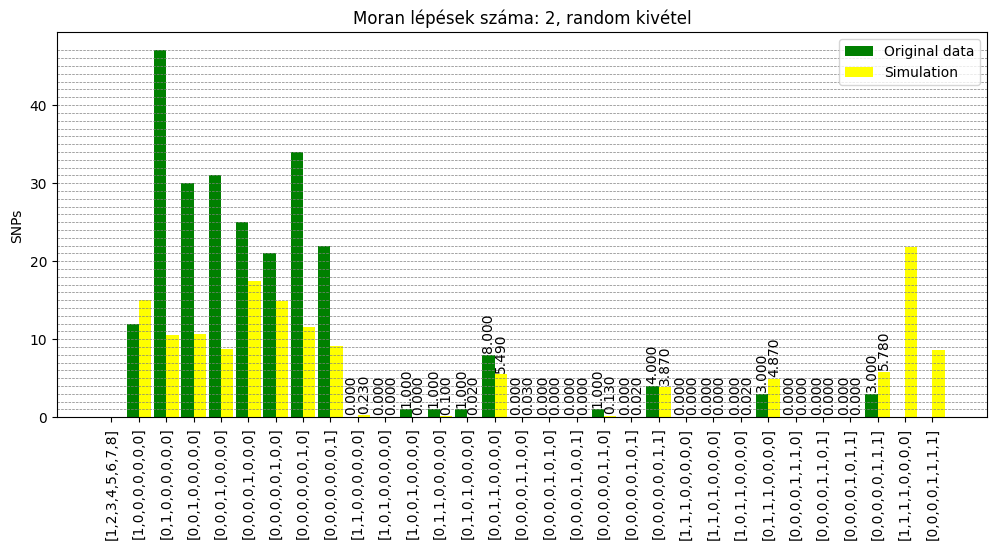

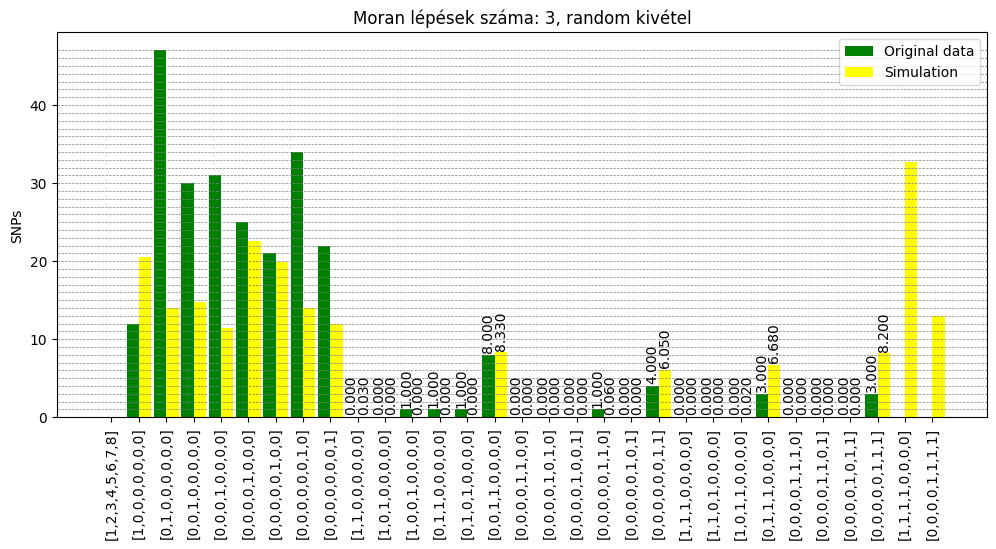

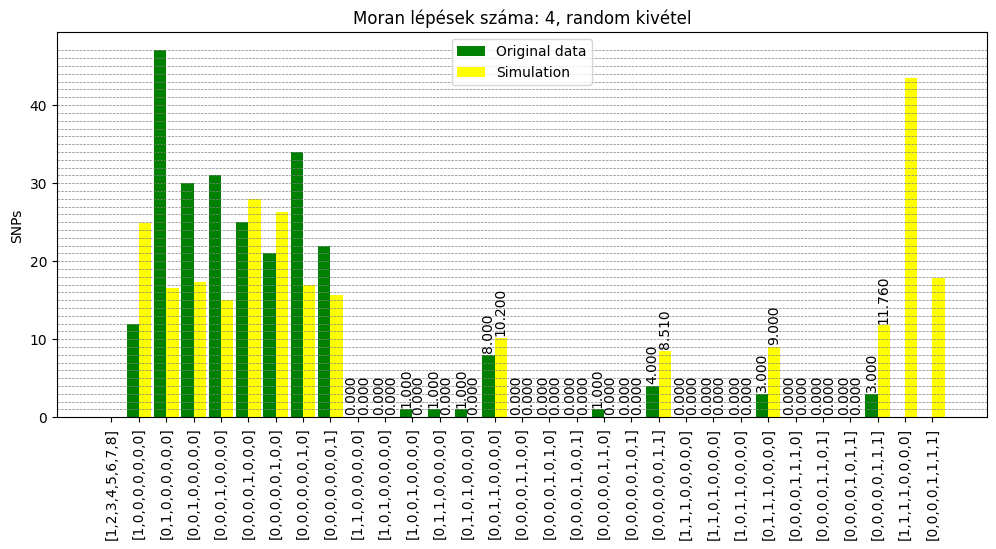

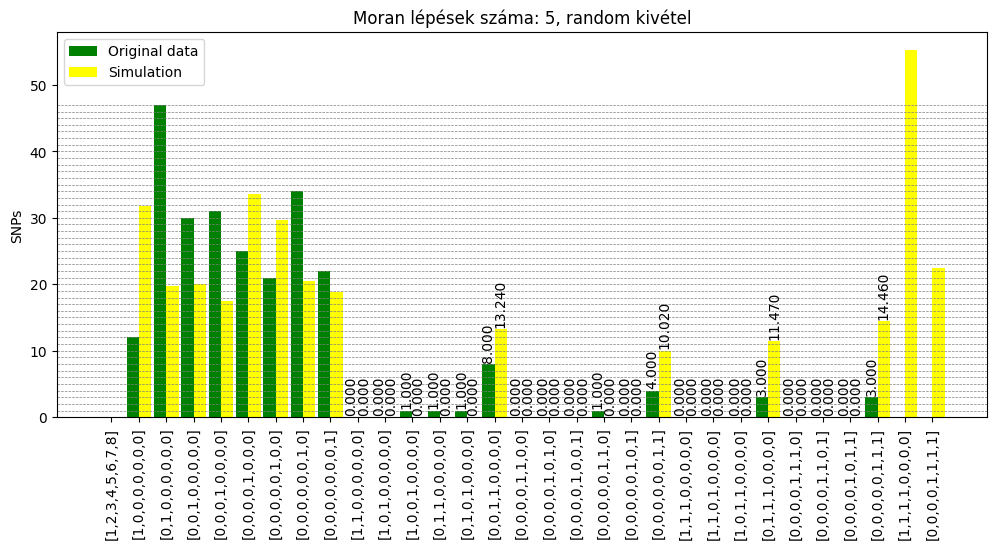

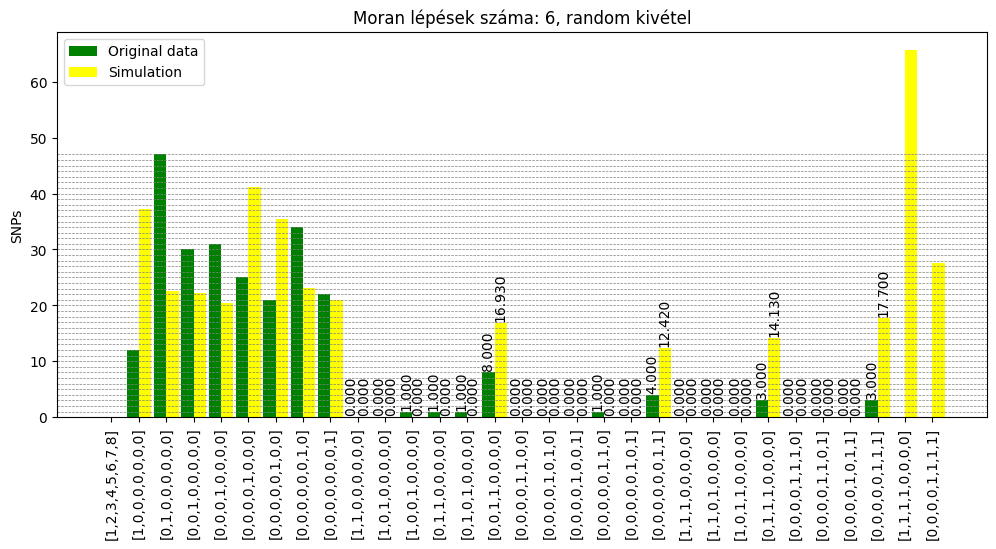

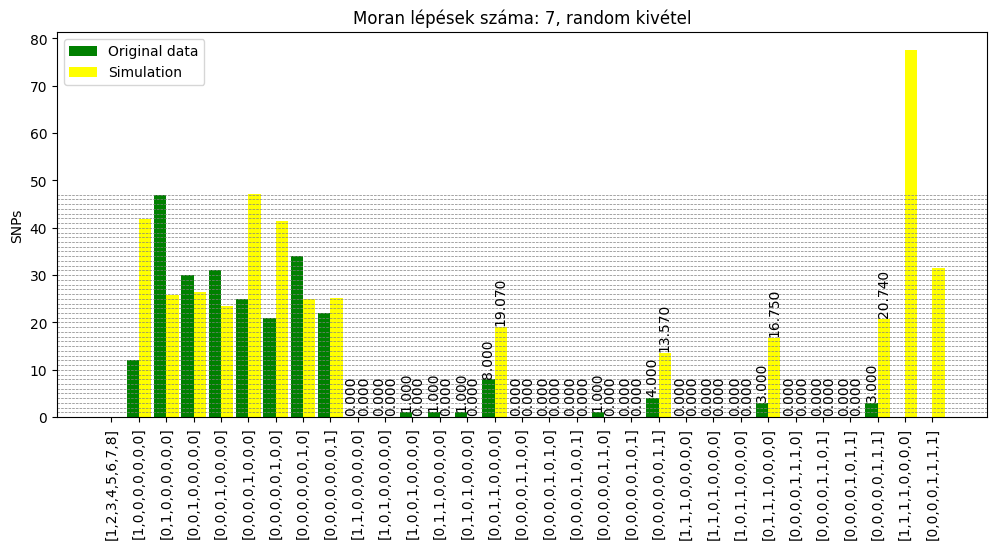

In [35]:
for j in range(7):
    plotting(final_tree_14[j], final_tree_13[j])

# Változtassuk a Moran lépések számát 1-4 között, illetve a sejtek számát 7-14 között.


In [45]:
a = np.zeros((8,3,15))
#for i in range(7,15):
#    for j in range(1,4):
#        a[i-7][j-1] = 1
print(a)

[[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  [0. 0.

In [46]:
final_tree_14 = np.zeros((8,3,15))
final_tree_13 = np.zeros((8,3,15))


for k in range(7,15):
    for n in range(1,4):
        tree_13_res = np.zeros(15)
        tree_14_res = np.zeros(15)
        for i in range(100):
            sim = DFS(newick.loads(newick_tree)[0], k, [None], [1], [], [[[]]*k,[], 1], [], [], moran_steps = n)
            sim.pop()

            tree_14_mut = [rd.choice(sim[0]), rd.choice(sim[1]), rd.choice(sim[2]), rd.choice(sim[3])]
            tree_13_mut = [rd.choice(sim[4]), rd.choice(sim[5]), rd.choice(sim[6]), rd.choice(sim[7])]
            tree_14_res += np.array(fun(tree_14_mut))
            tree_13_res += np.array(fun(tree_13_mut))

        avg_tree_14 = tree_14_res/100
        avg_tree_13 = tree_13_res/100
        
        final_tree_14[k-7][n-1] = avg_tree_14
        final_tree_13[k-7][n-1] = avg_tree_13

In [51]:
print(final_tree_13[0][0][0])

9.42


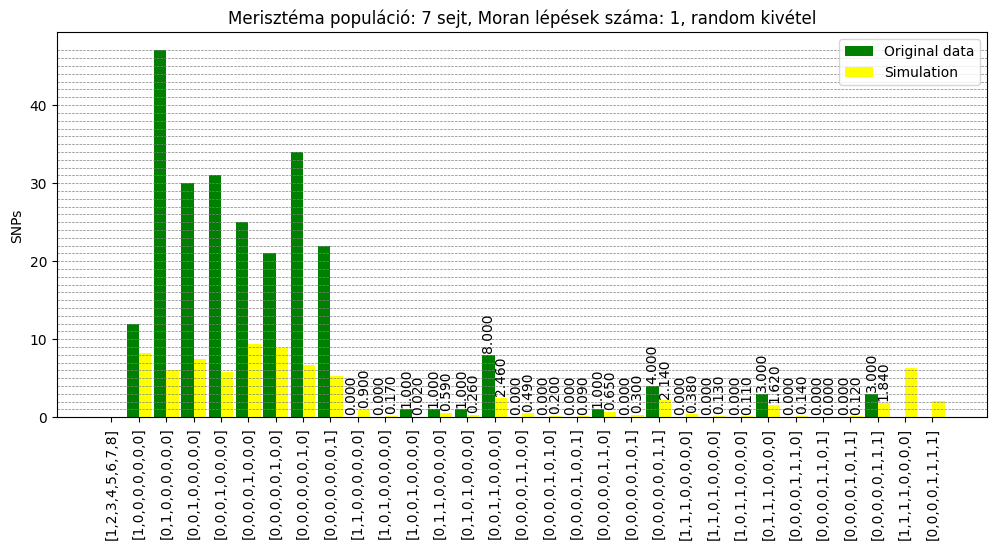

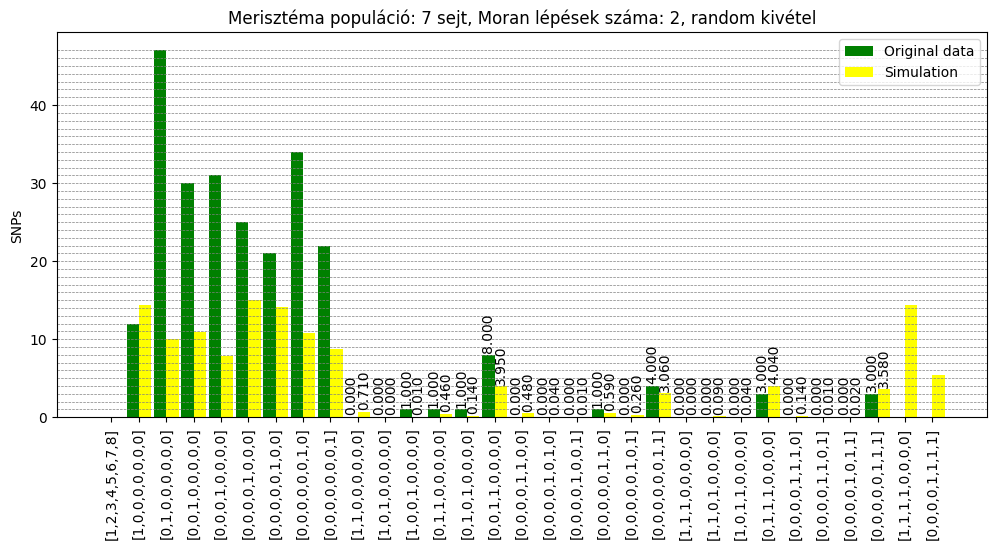

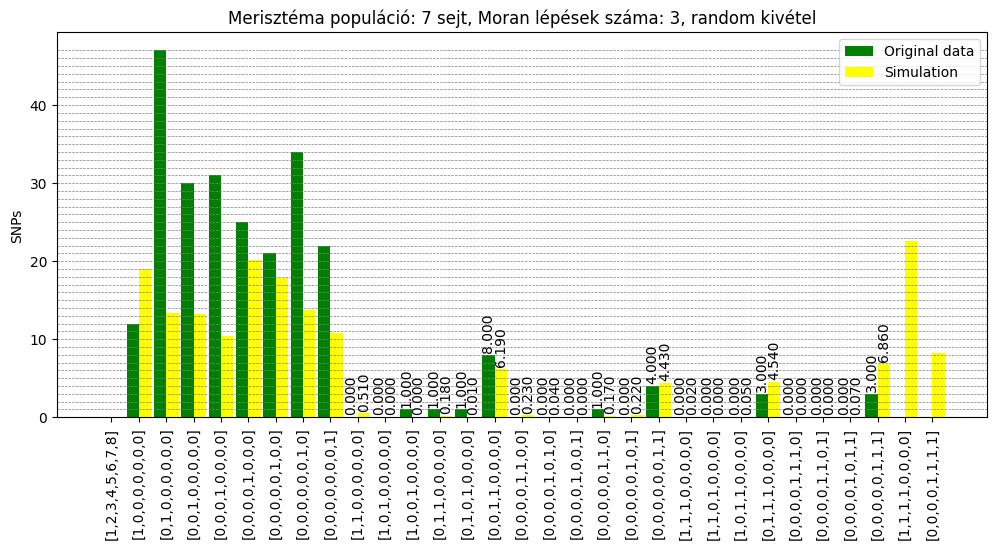

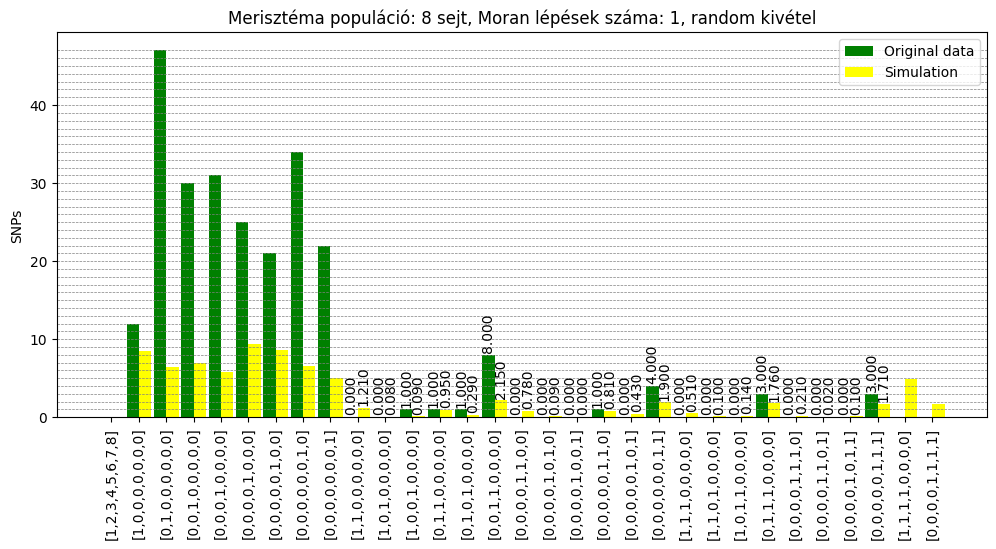

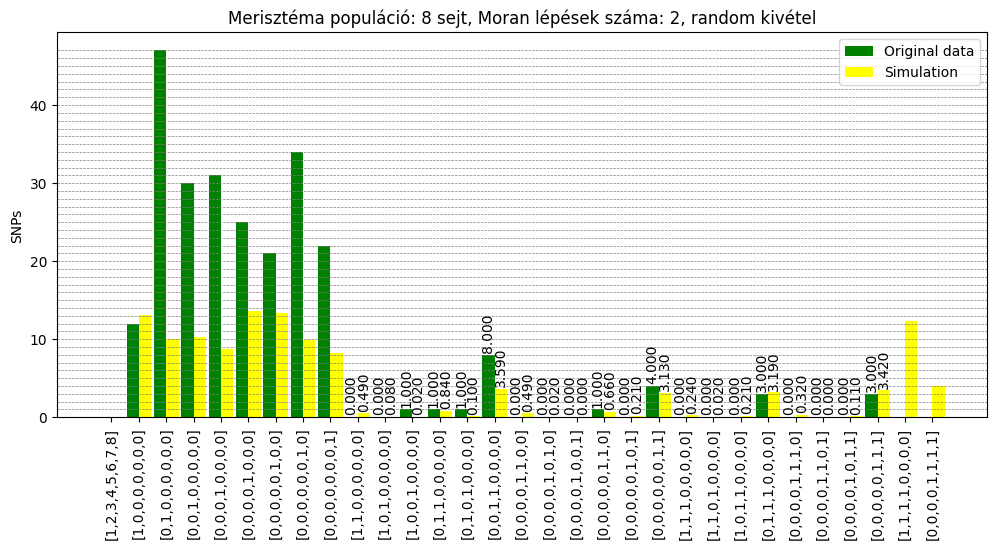

...

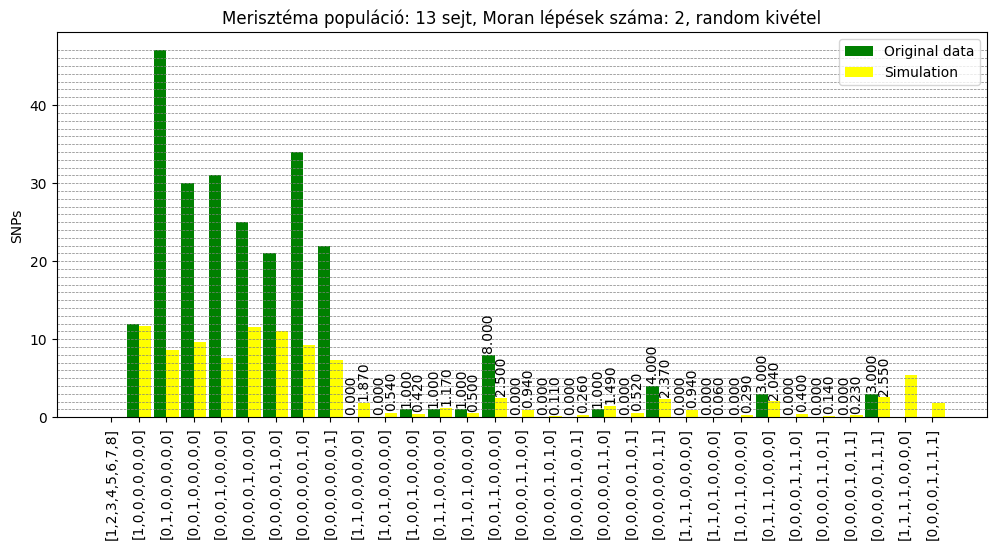

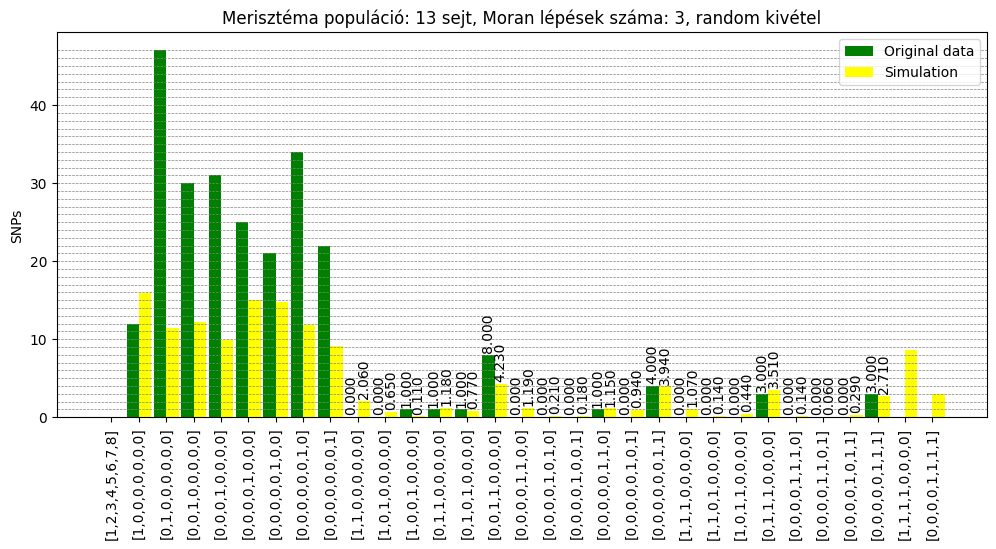

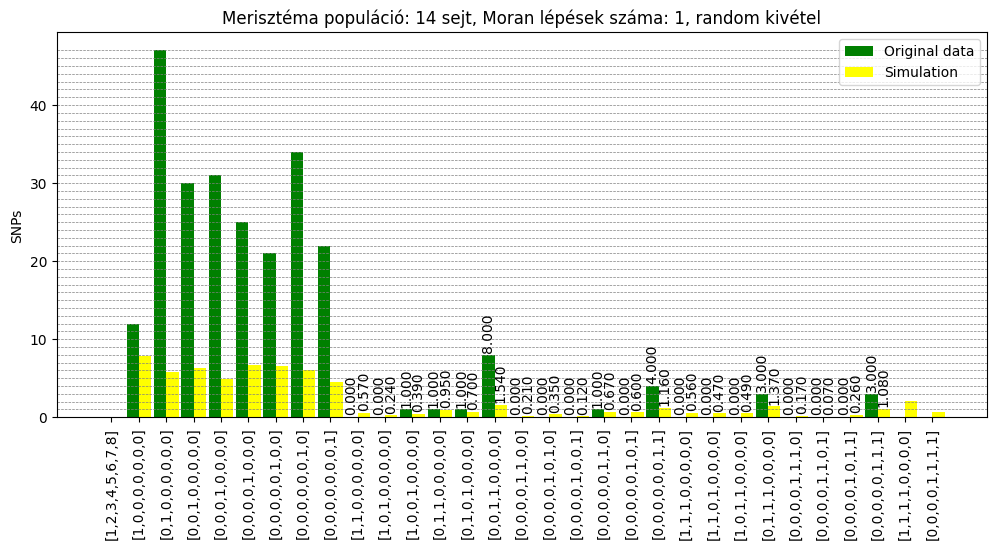

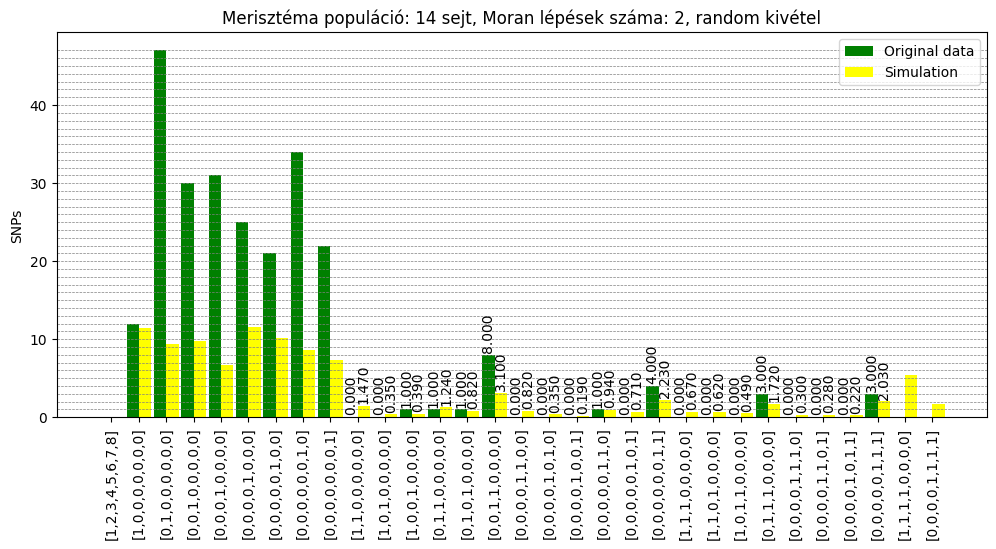

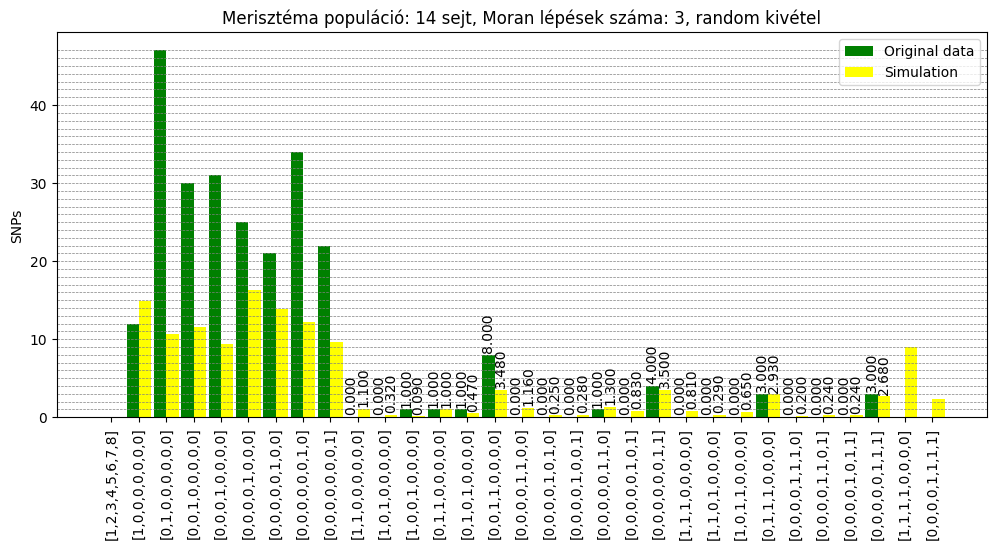

In [57]:
for l in range(8):
    for j in range(3):
        plotting(final_tree_14[l][j], final_tree_13[l][j])

# Mutáció ráta változtatása

In [59]:
#egybegyúrva a két fv. Ez csak azokban csinál mutációt, ami osztódik
def duplication_and_mutation(culture, for_duplication, m, mutation_rate):
    after_duplication=[]
    r = mutation_rate
#itt range(N) volt eddig
    for i in range(len(culture)):
        mutates=[]
        if i in for_duplication:
            mutates.append(deepcopy(culture[i]))
            mutates.append(deepcopy(culture[i]))  
            for j in range(2):
                c = rd.uniform(0,1)
                #print(c)
                if c <= r:
                    mutates[j].append(m)   
                    after_duplication.append(deepcopy(mutates[j]))
                    m = m+1
                else:
                    after_duplication.append(deepcopy(mutates[j]))    
        else:
            after_duplication.append(deepcopy(culture[i]))
    return after_duplication,m

#ez pedig az osztódás rész
def propagation(n,single_cell, starter_mutation, mutation_rate): #1 bemenet: 1 sejt a mutációkkal.
    bemenet=deepcopy(single_cell)
    mutate_m=starter_mutation
    for i in range(decider(n)[0]):
        #print('Culture:', bemenet)
        #print(bemenet)
        valasztott=choose_from_population(bemenet,len(bemenet))
        #print(valasztott)
        kettozott_es_mutalt, mutate_m=duplication_and_mutation(bemenet,valasztott, mutate_m, mutation_rate)
        #print(kettozott_es_mutalt)
        #mutalt=getting_mutations(kettozott,last_mutation)
        #print(mutalt)
        #last_mutation=mutalt[1]
        bemenet=deepcopy(kettozott_es_mutalt)
        #print('Culture:', bemenet)
    valasztott=choose_from_population(bemenet,decider(n)[1])
    #print(valasztott)
    kettozott_es_mutalt, mutate_m=duplication_and_mutation(bemenet, valasztott, mutate_m, mutation_rate)
    #print(kettozott_es_mutalt)
    #mutalt=getting_mutations(kettozott,last_mutation)
    #print(mutalt)
    bemenet=deepcopy(kettozott_es_mutalt)
    #print(bemenet)
    last_mutation=mutate_m
    
    return(bemenet, last_mutation)

def simulate(to, n, starter_culture, starter_mutation, moran_steps_in_a_year, mutation_rate): 
                                #bemenete: to -> lista, ami tartalmazza, hogy meddig megy és hol égazik
                                #n -> int, populáció mérete
                                #starter_culture -> lista, ami tartalmazza a mutációkat
                                #starter_mutation -> int, kezdeti mutációs szám
                                #moran_steps_in_a_year -> int, Moran lépések száma egy év alatt. 
    
    mutate_m = starter_mutation
    culture = deepcopy(starter_culture)
    branching_buds = []
    #print('Kezdeti populáció:', culture)
    #lim=int(to[-1]) #to utolsó eleme tartalmazza, hogy meddig menjen --> korábban
    lim = to
    if len(culture) == 1:
        culture, mutate_m=propagation(n,culture,mutate_m, mutation_rate)
    for i in range(moran_steps_in_a_year * lim):
        #print(i)
        #print('\n','Populáció a(z)', i+1,'. Moran lépés kezdetén', culture)
        k = 1
        choices = choose_from_population(culture,k)
        #print('Sorszám osztódásra:',choices)
        duplicated_and_mutated, mutate_m = duplication_and_mutation(culture, choices, mutate_m, mutation_rate)
        #print('Megkettőződtek és mutáltak',duplicated_and_mutated)
        after_creating_buds = deepcopy(creating_buds_random(duplicated_and_mutated, n)[0])
        #print('Rügyképzés után:',after_creating_buds)  
        if i == moran_steps_in_a_year * lim - 1:
            #branching_buds.append([deepcopy(creating_buds(duplicated_and_mutated)[1])])
            branching_buds=[deepcopy(creating_buds_random(duplicated_and_mutated, n)[1])]
        culture=deepcopy(after_creating_buds)
    #print('Kimeneti populáció', culture)
    #print('Rügy:', branching_buds)
    next_mutation = mutate_m
    return culture, branching_buds,next_mutation

def DFS(node, n, last_node_name, last_node_children_number,  brain_list, starter_list, results, end_of_branch, moran_steps, mutation_rate):
    lengths = []
    last_node_name.append(node.name)
    a = node.length
    children = node.descendants[::-1]
    last_node_children_number.append(len(children))
    #print('\n')
    #print('Az előző node neve:',last_node_name[-2])
    #print('Előző node gyerekek száma:', last_node_children_number[-2])
    #print('\n')
    #print('Ezen a node-on vagyunk:', node.name)
    #print('Node hossza:', node.length)
    #print('Ennyi gyereke van:', len(children))
    #print('\n')
    if len(children) == 2 and last_node_children_number[-2] == 2:
        res = simulate(int(a), n , starter_list[1], starter_list[2], moran_steps, mutation_rate)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        brain_list.append(res[0])

    elif len(children) == 2 and last_node_children_number[-2] == 1:
        res = simulate(int(a), n , starter_list[0], starter_list[2], moran_steps, mutation_rate)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        brain_list.append(res[0])

    elif len(children) == 1 and last_node_children_number[-2] == 2:
        res = simulate(int(a), n , starter_list[1], starter_list[2], moran_steps, mutation_rate)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]

    elif len(children) == 1 and last_node_children_number[-2] == 1:
        res = simulate(int(a), n , starter_list[0], starter_list[2], moran_steps, mutation_rate)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]

    elif len(children) == 2 and last_node_children_number[-2] == 0:
        res = simulate(int(a), n , brain_list[-1], starter_list[2], moran_steps, mutation_rate)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        if len(brain_list) != 0:
            brain_list.pop() 
        brain_list.append(res[0])


    elif len(children) == 1 and last_node_children_number[-2] == 0: 
        res = simulate(int(a), n , brain_list[-1], starter_list[2], moran_steps, mutation_rate)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        if len(brain_list) != 0:
            brain_list.pop() 
    
    elif len(children) == 0 and last_node_children_number[-2] == 0:
        res = simulate(int(a), n , brain_list[-1], starter_list[2], moran_steps, mutation_rate)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        end_of_branch.append(res[0])
        if len(brain_list) != 0:
            brain_list.pop() 
    
    elif len(children) == 0 and last_node_children_number[-2] == 1:
        res = simulate(int(a), n , starter_list[0], starter_list[2], moran_steps, mutation_rate)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        end_of_branch.append(res[0])
    
    elif len(children) == 0 and last_node_children_number[-2] == 2: 
        res = simulate(int(a), n , starter_list[1], starter_list[2], moran_steps, mutation_rate)
        starter_list[0] = res[0]
        starter_list[1] = res[1]
        starter_list[2] = res[2]
        results.append(res)
        end_of_branch.append(res[0])
    
    #print(brain_list)
    lengths.append(a)
    for descendants in node.descendants[::-1]:

        #if descendants.name != None:
        #    if len(brain_list) != 0:
        #        brain_list.pop() 
        kisebb_fa=DFS(descendants, n, last_node_name, last_node_children_number, brain_list, starter_list, results, end_of_branch, moran_steps, mutation_rate)
        #lengths.append(kisebb_fa)

    return end_of_branch

In [60]:
final_tree_14 = np.zeros((5,8,3,15))
final_tree_13 = np.zeros((5,8,3,15))
mutation_rates = [0.05, 0.1, 0.2, 0.4, 0.45]

for q in range(5):

    for k in range(7,15):
        
        for n in range(1,4):

            tree_13_res = np.zeros(15)
            tree_14_res = np.zeros(15)

            for i in range(100):

                sim = DFS(newick.loads(newick_tree)[0], k, [None], [1], [], [[[]]*k,[], 1], [], [], moran_steps = n, mutation_rate = mutation_rates[q])
                sim.pop()

                tree_14_mut = [rd.choice(sim[0]), rd.choice(sim[1]), rd.choice(sim[2]), rd.choice(sim[3])]
                tree_13_mut = [rd.choice(sim[4]), rd.choice(sim[5]), rd.choice(sim[6]), rd.choice(sim[7])]
                tree_14_res += np.array(fun(tree_14_mut))
                tree_13_res += np.array(fun(tree_13_mut))

            avg_tree_14 = tree_14_res/100
            avg_tree_13 = tree_13_res/100
            
            final_tree_14[q][k-7][n-1] = avg_tree_14
            final_tree_13[q][k-7][n-1] = avg_tree_13

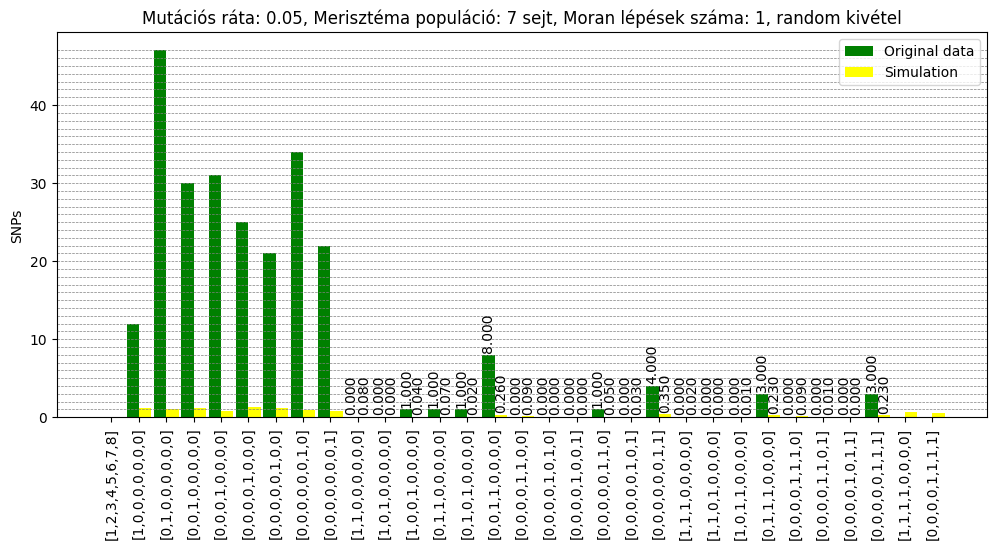

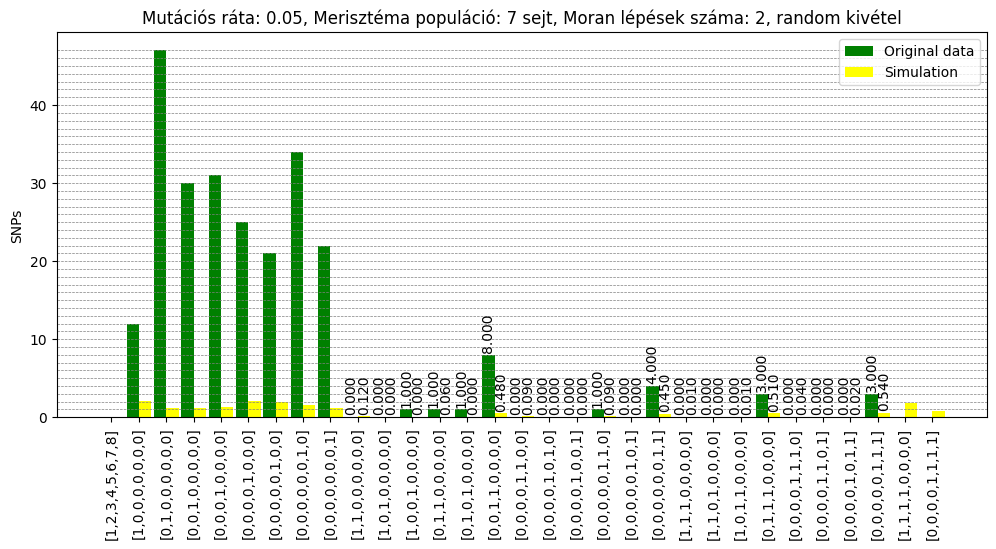

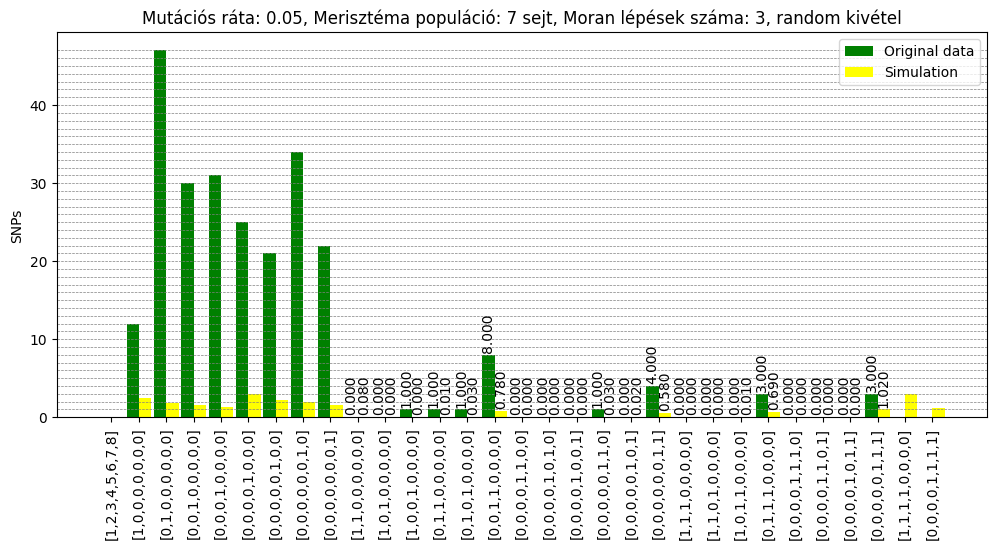

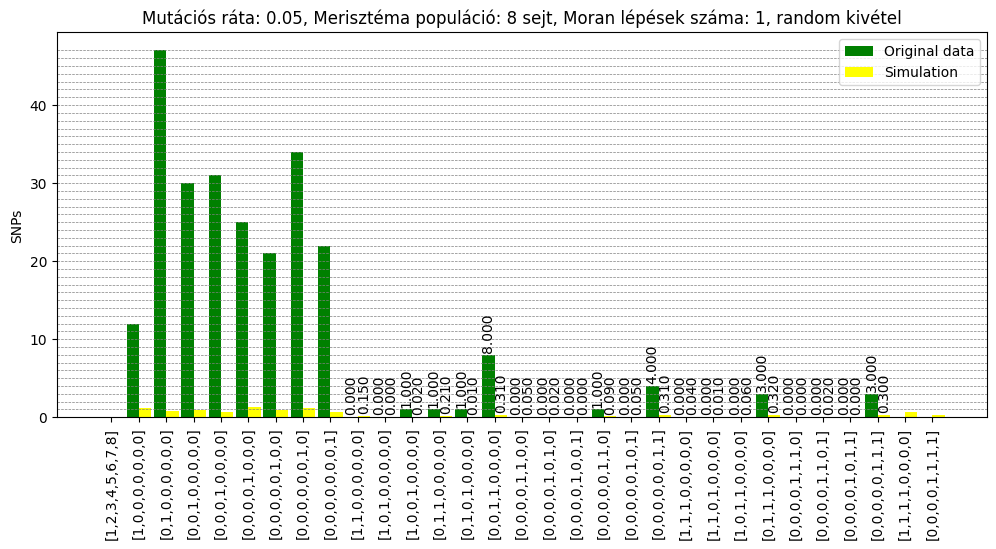

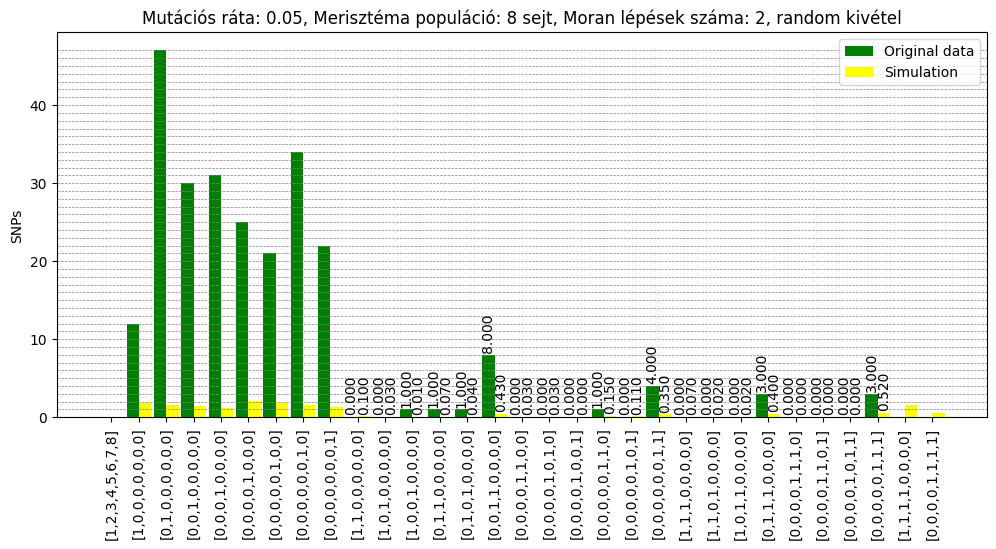

...

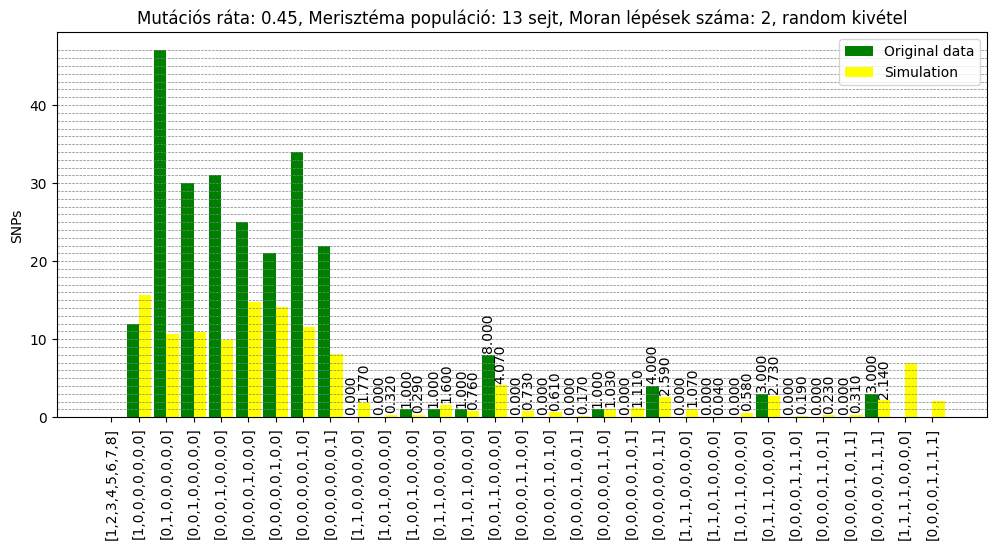

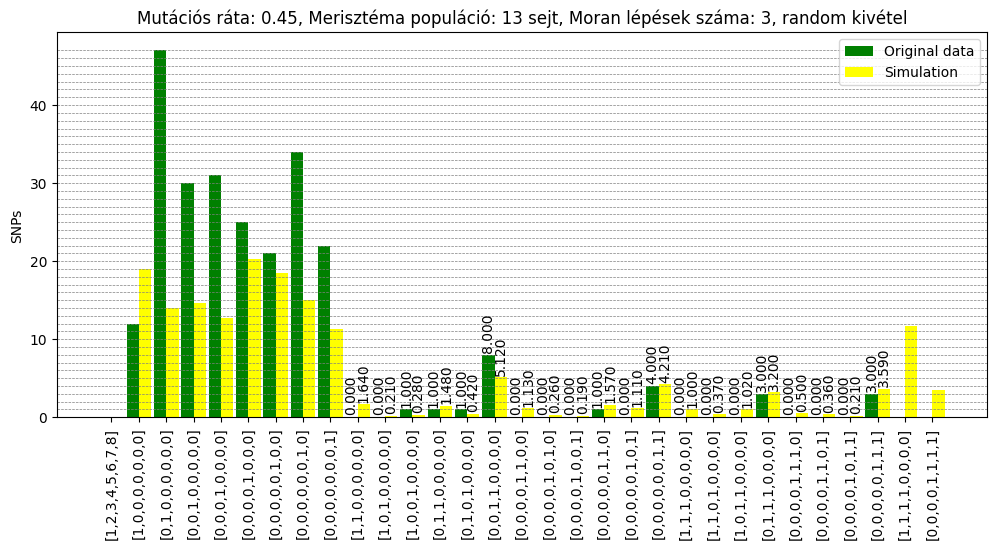

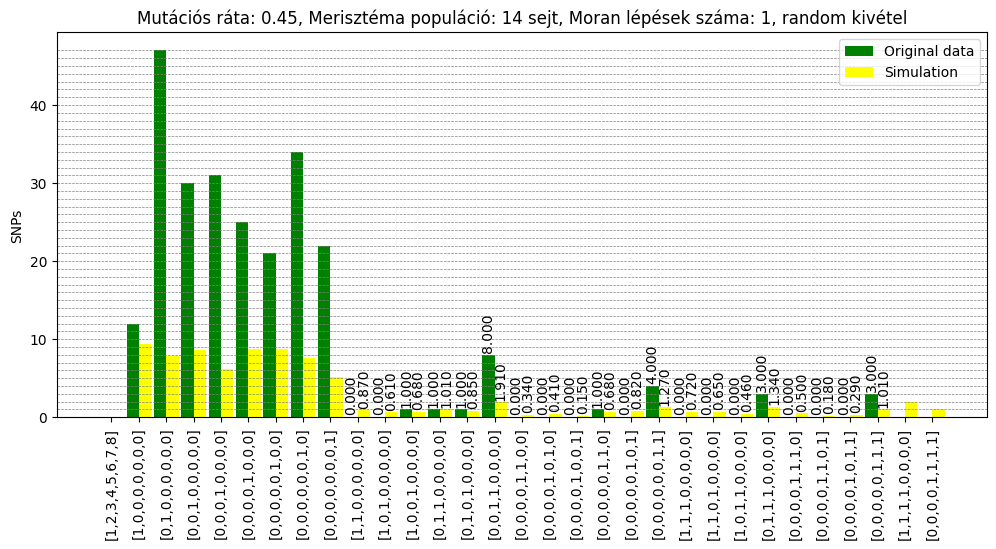

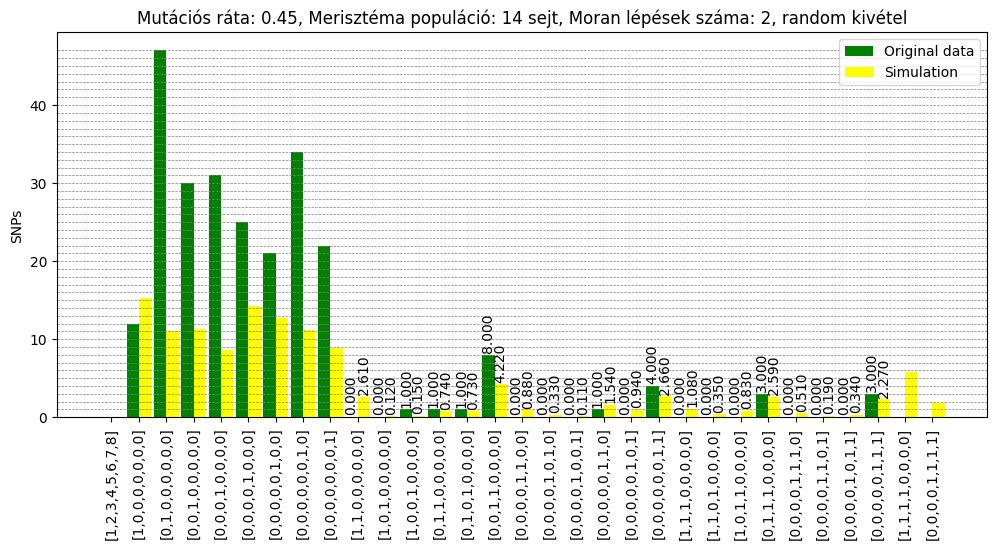

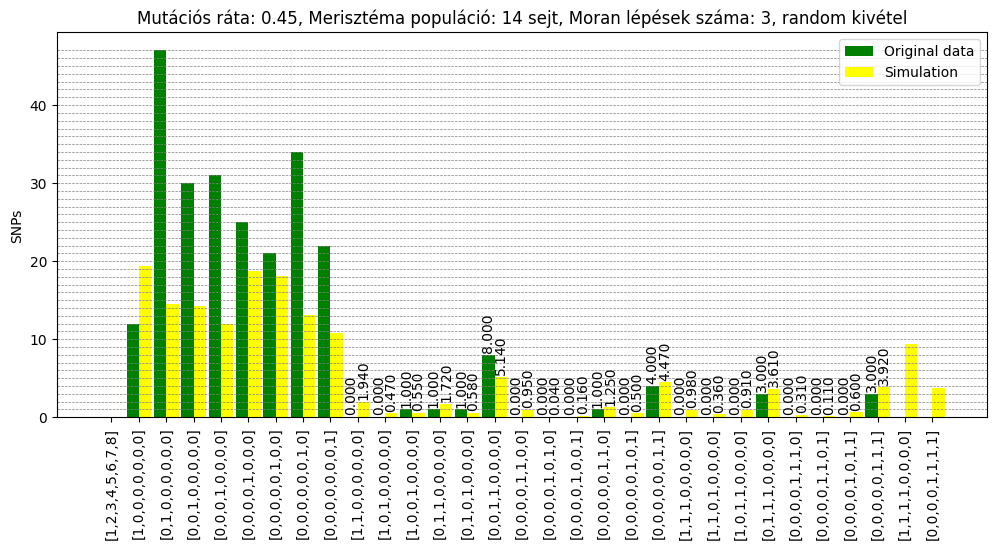

In [64]:
for p in range(5):
    for l in range(8):
        for j in range(3):
            plotting(final_tree_14[p][l][j], final_tree_13[p][l][j])

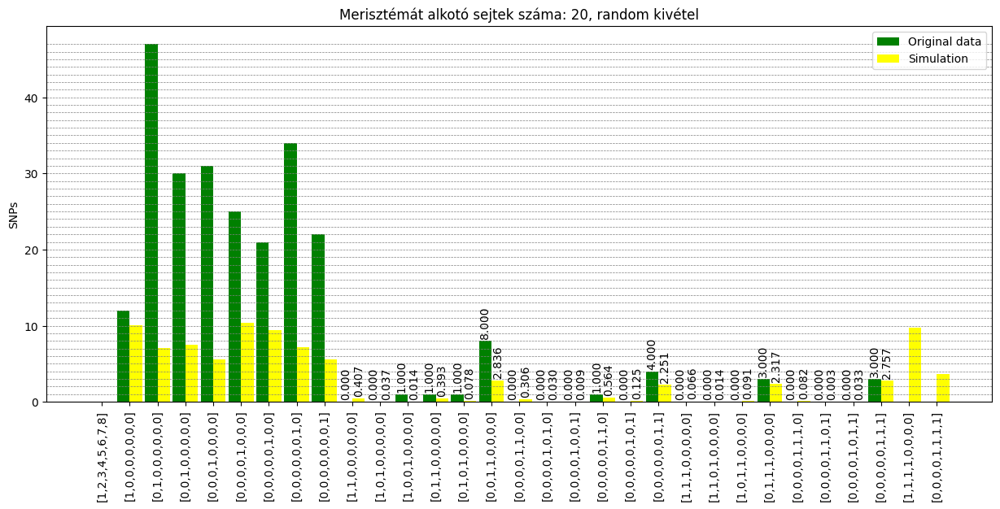

In [20]:

y_values = [0, 12, 47, 30, 31, 25, 21, 34, 22, 0, 0, 1, 1, 1, 8, 0, 0, 0, 1, 0, 4, 0, 0, 0, 3, 0, 0, 0, 3, 0, 0 ]

y_values_sim = [ 0, avg_tree_14[0], avg_tree_14[1], avg_tree_14[2], avg_tree_14[3],
                 avg_tree_13[0], avg_tree_13[1], avg_tree_13[2], avg_tree_13[3],
                 avg_tree_14[4], avg_tree_14[5], avg_tree_14[6], avg_tree_14[7], avg_tree_14[8], avg_tree_14[9],
                 avg_tree_13[4], avg_tree_13[5], avg_tree_13[6], avg_tree_13[7], avg_tree_13[8], avg_tree_13[9],
                 avg_tree_14[10], avg_tree_14[11], avg_tree_14[12], avg_tree_14[13],
                 avg_tree_13[10], avg_tree_13[11], avg_tree_13[12], avg_tree_13[13],
                 avg_tree_14[14],
                 avg_tree_13[14]]

all_in_all = [  0,
                y_values[0], avg_tree_14[0], y_values[1], avg_tree_14[1], y_values[2], avg_tree_14[2], y_values[3], avg_tree_14[3],
                y_values[4], avg_tree_13[0], y_values[5], avg_tree_13[1], y_values[6], avg_tree_13[2], y_values[7], avg_tree_13[3],
                y_values[8], avg_tree_14[4], y_values[9], avg_tree_14[5], y_values[10], avg_tree_14[6], y_values[11], avg_tree_14[7], y_values[12], avg_tree_14[8], y_values[13], avg_tree_14[9],
                y_values[14], avg_tree_13[4], y_values[15], avg_tree_13[5], y_values[16], avg_tree_13[6], y_values[17], avg_tree_13[7], y_values[18], avg_tree_13[8], y_values[19], avg_tree_13[9],
                y_values[20], avg_tree_14[10], y_values[21], avg_tree_14[11], y_values[22], avg_tree_14[12], y_values[23], avg_tree_14[13],
                y_values[24], avg_tree_13[10], y_values[25], avg_tree_13[11], y_values[26], avg_tree_13[12], y_values[27], avg_tree_13[13],
                y_values[28], avg_tree_14[14],
                y_values[29], avg_tree_13[14]]



x_values = ['[1,2,3,4,5,6,7,8]',
            '[1,0,0,0,0,0,0,0]', '[0,1,0,0,0,0,0,0]', '[0,0,1,0,0,0,0,0]', '[0,0,0,1,0,0,0,0]',
            '[0,0,0,0,1,0,0,0]', '[0,0,0,0,0,1,0,0]', '[0,0,0,0,0,0,1,0]', '[0,0,0,0,0,0,0,1]',
            '[1,1,0,0,0,0,0,0]', '[1,0,1,0,0,0,0,0]', '[1,0,0,1,0,0,0,0]', '[0,1,1,0,0,0,0,0]', '[0,1,0,1,0,0,0,0]', '[0,0,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,0,0]', '[0,0,0,0,1,0,1,0]', '[0,0,0,0,1,0,0,1]', '[0,0,0,0,0,1,1,0]', '[0,0,0,0,0,1,0,1]', '[0,0,0,0,0,0,1,1]',
            '[1,1,1,0,0,0,0,0]', '[1,1,0,1,0,0,0,0]', '[1,0,1,1,0,0,0,0]', '[0,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,0]', '[0,0,0,0,1,1,0,1]', '[0,0,0,0,1,0,1,1]', '[0,0,0,0,0,1,1,1]',
            '[1,1,1,1,0,0,0,0]',
            '[0,0,0,0,1,1,1,1]']

width = 0.45
x_positions = np.arange(len(x_values))

fig, ax = plt.subplots(figsize = (15,6))
bar1 = ax.bar(x_positions - width/2, y_values, width, color = 'green', label = 'Original data')
bar2 = ax.bar(x_positions + width/2, y_values_sim, width, color = 'yellow', label = 'Simulation')
ax.set_xticks(x_positions)
ax.set_xticklabels(x_values, rotation = 90)

for i in range(9,29):
    ax.text(x_positions[i] - width/2, y_values[i] + 0.3, f'{y_values[i]:.3f}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)
    ax.text(x_positions[i] + width/2, y_values_sim[i] + 0.3, f'{y_values_sim[i]:.3f}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)   
#for i, freq in enumerate(y_values):
#    ax.text(x_positions[i] - width/2, freq + 0.3, f'{freq:.1e}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)
#for i, freq in enumerate(y_values_sim):
#    ax.text(x_positions[i] + width/2, freq + 0.3, f'{freq:.1e}', ha='center', va='bottom', fontsize=10, color='black', rotation=90)

# Add horizontal grid lines

#annotated_indices = [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
#for i in range(9,49):
#    freq = all_in_all[i]
#    ax.text(i, freq+0.3, f'{freq:.1e}', ha='center', va='bottom', fontsize=10, color='black', rotation = 90)

for y_value in range(1, math.ceil(max(all_in_all))+1):
    ax.axhline(y = y_value, color = 'gray', linestyle = '--', linewidth=0.5)
ax.set_title(f'Merisztémát alkotó sejtek száma: 20, random kivétel')
ax.set_ylabel('SNPs')
ax.legend()
#plt.savefig('Random_kivétel_5_sejt', format = 'png')
plt.show()

In [14]:
sim.pop()
paired_lists = [pair for pair in combinations(sim, 2)]
for item in paired_lists:
    print(item)

flattened_lists = [(np.concatenate(pair[0]), np.concatenate(pair[1])) for pair in paired_lists]

# Find differences in each pair and count occurrences
differences_count = [len(set(pair[0]) ^ set(pair[1])) for pair in flattened_lists]

print(f"The answer is: {differences_count}")
print(len(differences_count))


([[], [], [], [], []], [[], [], [], [], []])
([[], [], [], [], []], [[], [], [], [], []])
([[], [], [], [], []], [[], [], [], [], []])
([[], [], [], [], []], [[7, 11], [7, 11], [7, 11], [7, 11], [7, 11]])
([[], [], [], [], []], [[7], [7], [7], [7], [7]])
([[], [], [], [], []], [[7], [7], [7], [7], [7]])
([[], [], [], [], []], [[7, 18], [7], [7], [7], [7]])
([[], [], [], [], []], [[], [], [], [], []])
([[], [], [], [], []], [[], [], [], [], []])
([[], [], [], [], []], [[7, 11], [7, 11], [7, 11], [7, 11], [7, 11]])
([[], [], [], [], []], [[7], [7], [7], [7], [7]])
([[], [], [], [], []], [[7], [7], [7], [7], [7]])
([[], [], [], [], []], [[7, 18], [7], [7], [7], [7]])
([[], [], [], [], []], [[], [], [], [], []])
([[], [], [], [], []], [[7, 11], [7, 11], [7, 11], [7, 11], [7, 11]])
([[], [], [], [], []], [[7], [7], [7], [7], [7]])
([[], [], [], [], []], [[7], [7], [7], [7], [7]])
([[], [], [], [], []], [[7, 18], [7], [7], [7], [7]])
([[], [], [], [], []], [[7, 11], [7, 11], [7, 11], [7, 11]

In [15]:
elofordulasok_sum=np.empty((0))
cumulative = np.zeros(28)
for i in range(10000):
    sim = DFS(newick.loads(newick_tree)[0], 5, [None], [1], [], [[[],[],[],[],[]],[], 1], [], [])
    sim.pop()
    paired_lists = [pair for pair in combinations(sim, 2)]
    for item in paired_lists:

        flattened_lists = [(np.concatenate(pair[0]), np.concatenate(pair[1])) for pair in paired_lists]

# Find differences in each pair and count occurrences
        differences_count = [len(set(pair[0]) ^ set(pair[1])) for pair in flattened_lists]
    cumulative = cumulative + np.array(differences_count)
cumulative_average=cumulative/10000
print(cumulative_average)

[0.4296 0.4931 0.461  1.0895 1.1348 1.128  1.105  0.3825 0.3504 1.0803
 1.1256 1.1188 1.0958 0.3015 1.1438 1.1891 1.1823 1.1593 1.1117 1.157
 1.1502 1.1272 0.5027 0.4959 0.4729 0.426  0.4032 0.3088]


In [15]:
branches_in_order = ['14.5', '14.4', '14.3', '14.2', '13.5', '13.3', '13.2', '13.1']
ages_in_order = [287, 287, 324, 324, 297, 328, 327, 328]
pairs_in_order = ['14.5-14.4', '14.5-14.3', '14.5-14.2', '14.5-13.5', '14.5-13.3', '14.5-13.2', '14.5-13.1', '14.4-14.3', '14.4-14.2', '14.4-13.5', '14.4-13.3', '14.4-13.2', '14.4-13.1', '14.3-14.2', '14.3-13.5', '14.3-13.3', '14.3-13.2', '14.3-13.1', '14.2-13.5', '14.2-13.3', '14.2-13.2', '14.2-13.1', '13.5-13.3', '13.5-13.2', '13.5-13.1', '13.3-13.2', '13.3-13.1', '13.2-13.1' ]
pairs_ages_in_order = [144, 181, 181, 560, 591, 590, 591, 117, 117, 560, 591, 590, 591, 82, 597, 628, 627, 628, 597, 628, 627, 628, 191, 190, 191, 139, 140, 83 ]

In [16]:
data = np.array(cumulative_average)
x_val = np.array(pairs_ages_in_order)
sorted_indices = np.argsort (x_val)
sorted_data = data[sorted_indices]
sorted_ages = x_val[sorted_indices]

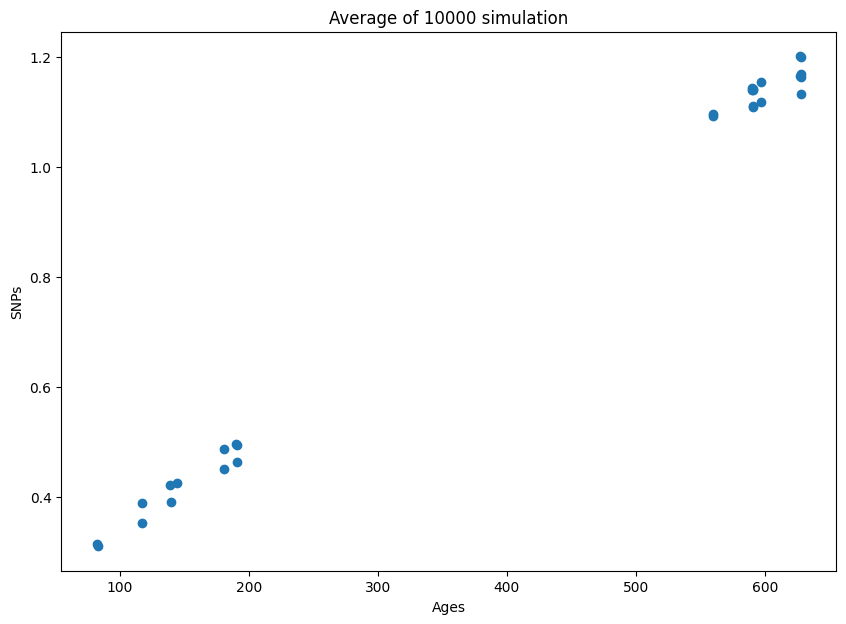

In [17]:
fig, ax = plt.subplots(figsize=(10,7))

graph = ax.scatter(x_val, data)

#points_to_annotate = [(1, 'Br. 13.5'), (2, 'Br. 14.5'), (3, 'Br. 14.4'), (4, 'Br. 13.3' ), (5, 'Br. 13.2'), (6, 'Br. 14.3'), (7, 'Br. 13.1'), (8, 'Br. 14.2')]

#for point in points_to_annotate:
#    ax.annotate(point[1], (x[point[0] - 1], y[point[0] - 1]), textcoords="offset points", xytext=(0, 5), ha='center')
ax.set_xlabel('Ages')
ax.set_ylabel('SNPs')
ax.set_title('Average of 10000 simulation')
plt.show()

In [28]:
elofordulasok_sum=np.empty((0))
cumulative = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0])
for i in range(1000):
    sim = DFS(newick.loads(newick_tree)[0], 5, [None], [1], [], [[[],[],[],[],[]],[], 1], [], [])
    ledaraltak = [np.unique(np.concatenate(sim[i][0])).tolist() for i in range(9)]
    ledaraltak_osszesitve = np.concatenate(ledaraltak)
    unique_val, counts = np.unique(ledaraltak_osszesitve, return_counts = True)
    egyutt = np.array((unique_val, counts))
    feltetel = egyutt[1] == 1
    singlets = egyutt[0, feltetel].tolist()
    ledaraltak_singlets = [[elem for elem in sublist if elem in singlets] for sublist in ledaraltak]
    singlet_mutant_numbers = list(map(len, ledaraltak_singlets))
    cumulative = cumulative + np.array(singlet_mutant_numbers)

    #print(ledaraltak)
    #print(ledaraltak_osszesitve)
    #print(egyutt)
    #print(singlets)
    #print(ledaraltak_singlets)
    #print(singlet_mutant_numbers)
    #print(cumulative/200)
    #print(series)
cumulative_average=cumulative/1000
print(cumulative_average)

ValueError: need at least one array to concatenate

In [14]:
print(cumulative_average[2])

0.175


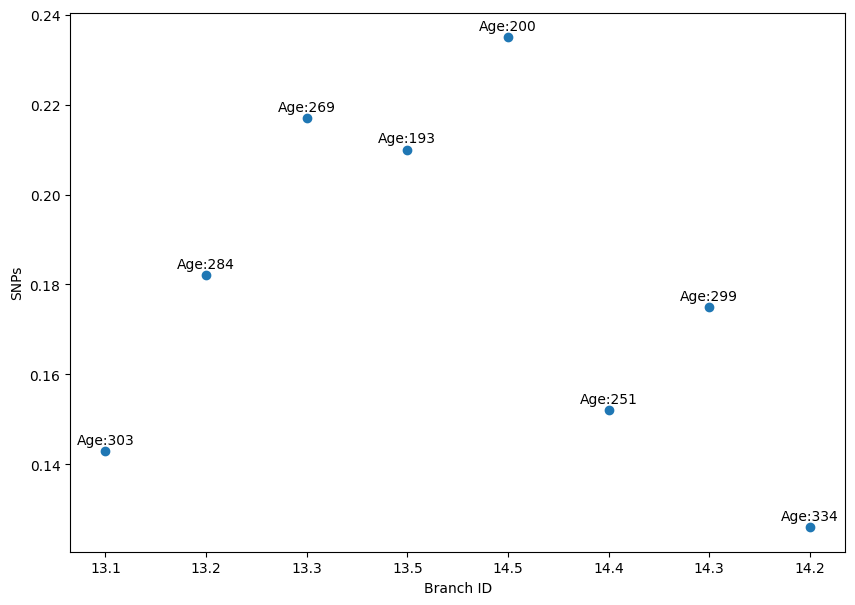

In [15]:
x = ['13.1', '13.2', '13.3', '13.5', '14.5', '14.4', '14.3', '14.2']
y = [ cumulative_average[7], cumulative_average[6], cumulative_average[5], cumulative_average[4], cumulative_average[0], cumulative_average[1], cumulative_average[2], cumulative_average[3] ]
fig, ax = plt.subplots(figsize=(10,7))

graph = ax.scatter(x,y)

points_to_annotate = [(1, 'Age:303'), (2, 'Age:284'), (3, 'Age:269'), (4, 'Age:193' ), (5, 'Age:200'), (6, 'Age:251'), (7, 'Age:299'), (8, 'Age:334')]

for point in points_to_annotate:
    ax.annotate(point[1], (x[point[0] - 1], y[point[0] - 1]), textcoords="offset points", xytext=(0, 5), ha='center')
ax.set_xlabel('Branch ID')
ax.set_ylabel('SNPs')
plt.show()

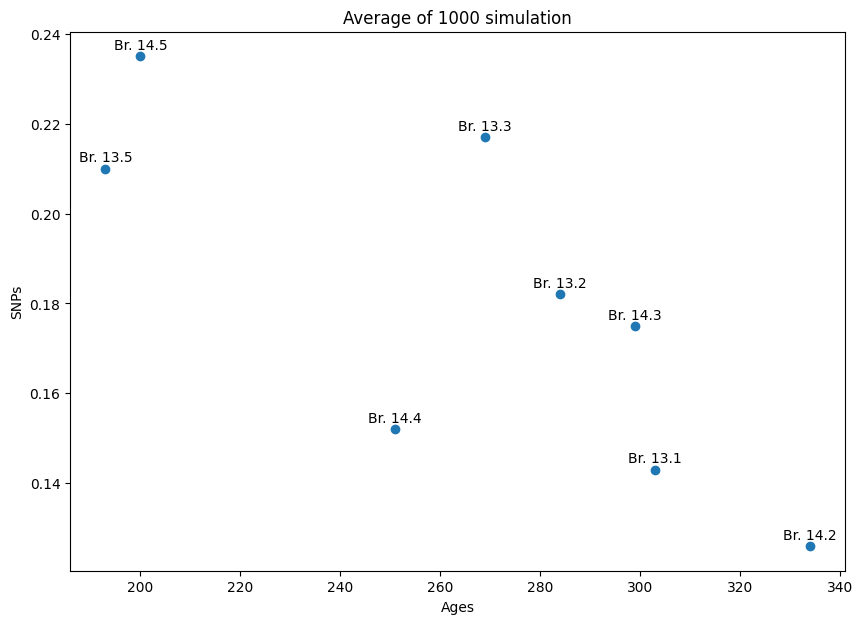

In [16]:
#ez a cella arra van fenntartva, hogy itt az idő legyen a vízszintes tengelyen növekvő sorrendben, mint a Hofmeister cikkben
x = [193, 200, 251, 269, 284, 299, 303, 334]
y = [ cumulative_average[4], cumulative_average[0], cumulative_average[1], cumulative_average[5], cumulative_average[6], cumulative_average[2], cumulative_average[7], cumulative_average[3] ]
fig, ax = plt.subplots(figsize=(10,7))

graph = ax.scatter(x,y)

points_to_annotate = [(1, 'Br. 13.5'), (2, 'Br. 14.5'), (3, 'Br. 14.4'), (4, 'Br. 13.3' ), (5, 'Br. 13.2'), (6, 'Br. 14.3'), (7, 'Br. 13.1'), (8, 'Br. 14.2')]

for point in points_to_annotate:
    ax.annotate(point[1], (x[point[0] - 1], y[point[0] - 1]), textcoords="offset points", xytext=(0, 5), ha='center')
ax.set_xlabel('Ages')
ax.set_ylabel('SNPs')
ax.set_title('Average of 1000 simulation')
plt.show()

In [19]:
#mutaciok=np.empty((0))
elofordulasok_sum=np.empty((0))

for i in range(1000):
    
    sim = DFS(newick.loads(newick_tree)[0], 5, [None], [1], [], [[[],[],[],[],[]],[], 1], [], [])
    ledaraltak = [np.unique(np.concatenate(sim[i][0])).tolist() for i in range(9)]
    ledaraltak_osszesitve_egy_agvegben = np.concatenate(ledaraltak).tolist()
    elofordulasok=pd.Series(ledaraltak_osszesitve_egy_agvegben).value_counts(sort=False).tolist()
    #mutaciok_szama = [len(ledaraltak[i]) for i in range(9)]
    #mutaciok = np.append(mutaciok, ledaraltak_oss                                  zesitve_egy_agvegben)
    elofordulasok_sum=np.append(elofordulasok_sum, elofordulasok)

    #print(sim)
    #print(ledaraltak)
    #print(ledaraltak_osszesitve_egy_agvegben)
    #print(elofordulasok)
    #print(mutaciok_szama)
    #print(mutaciok)

#
#mut_matrix=np.reshape(mutaciok_osszesitve,(2,9))



x_values=np.unique(sorted(elofordulasok_sum))

y_values=(pd.Series(sorted(elofordulasok_sum)).value_counts(sort=False).tolist())

averaged_y_values=np.array(y_values)/1000

#print(elofordulasok_sum)
#print('x_values:',x_values)
#print('y-values', y_values)
#print('averaged_y_values', averaged_y_values)




(array([1.478, 0.086, 0.103, 0.684, 0.   , 0.013, 0.   , 0.   , 0.   ,
        0.003]),
 array([1. , 1.8, 2.6, 3.4, 4.2, 5. , 5.8, 6.6, 7.4, 8.2, 9. ]),
 <BarContainer object of 10 artists>)

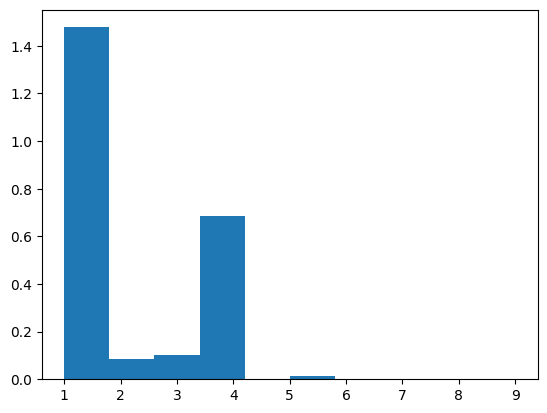

In [20]:
#x_values=['Sigleton', 'Doublet', 'Triplet', 'Quartet', 'Quintet', 'Sextet', 'Septet', 'Octet', 'Nonet']
plt.hist(x_values, weights=averaged_y_values)

[6.0, 9.0, 16.0, 16.0, 16.0, 10.0]
Előfordulások: 
 [1, 1, 3, 1]


(array([3., 0., 0., 0., 0., 0., 0., 0., 0., 1.]),
 array([1. , 1.2, 1.4, 1.6, 1.8, 2. , 2.2, 2.4, 2.6, 2.8, 3. ]),
 <BarContainer object of 10 artists>)

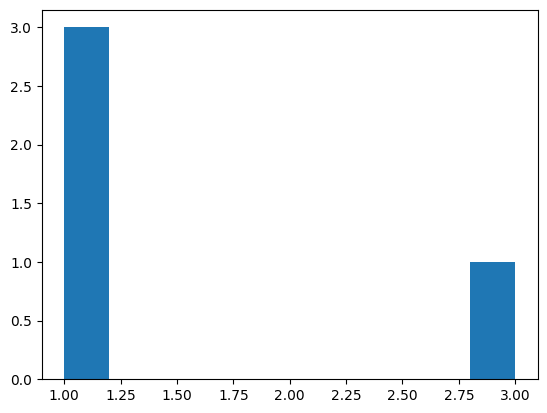

In [81]:

elofordulasok=pd.Series(ledaraltak_osszesitve_egy_agvegben).value_counts(sort=False).tolist()
print(ledaraltak_osszesitve_egy_agvegben)

print('Előfordulások:','\n',elofordulasok)
plt.hist(elofordulasok)

In [93]:
sajt=[1, 1, 1, 3, 1, 4, 1, 1, 1,]
#print(sajt/2)
print([i / 2 for i in sajt ])

[0.5, 0.5, 0.5, 1.5, 0.5, 2.0, 0.5, 0.5, 0.5]


In [30]:
print(sim)
ledaraltak=[np.unique(np.concatenate(sim[i][0])).tolist() for i in range(9)]
print(np.concatenate(sim[7][0]))
print(np.unique(np.concatenate(sim[7][0])))
print(len(np.unique(np.concatenate(sim[7][0]))))
#print(ledaraltak)
#elso,masik=rd.sample(ledaraltak,2)
#print('A választott két ágvégi sejtek mutációi:','\n',elso,masik)

#mutaciok_szama=len(list(set(elso).symmetric_difference(set(masik))))
#print('A közöttük lévő mutáció szám eltérés:', mutaciok_szama)



[([[1], [1], [1], [1], [1]], [[1]], 4), ([[1], [1], [1], [1], [1]], [[1]], 5), ([[1], [1], [1], [1], [1]], [[1]], 7), ([[1], [1], [1], [1], [1]], [[1]], 7), ([[], [], [], [], []], [[]], 12), ([[12, 14], [12, 14], [12, 14], [12, 14], [12, 14]], [[12, 14]], 15), ([[12], [12], [12], [12], [12]], [[12]], 16), ([[12, 16], [12, 16], [12, 16], [12, 16], [12, 16]], [[12, 16]], 18), ([[], [], [], [], []], [[]], 18)]
[12 16 12 16 12 16 12 16 12 16]
[12 16]
2


In [ ]:
0.463 0.494 0.446 1.102 1.147 1.113 1.121 0.415 0.367 1.109 1.154 1.12
1.128 0.298 1.14  1.185 1.151 1.159 1.092 1.137 1.103 1.111 0.485 0.451
0.459 0.4   0.408 0.29